# 🌳 Modern Decision Trees: From Fundamentals to Neuro-Symbolic AI
## A Comprehensive Journey Through Tree-Based Methods


We'll start with the fundamentals and progress to cutting-edge techniques used in modern machine learning.

## Agenda

1. *Fundamentals of Decision Trees*
   - How decision trees work
   - Visualization and interpretation
   - Strengths and limitations

2. *Ensemble Methods & XGBoost*
   - From single trees to forests
   - The XGBoost revolution
   - Practical implementation

3. *Understanding Through Visualization*
   - How boosting works
   - Feature importance
   - Model interpretability

4. *Building XGBoost from Scratch*
   - Core algorithm implementation
   - Understanding gradients
   - Adding optimizations

5. *Differentiable Decision Trees*
   - Neural networks meet trees
   - Soft routing and backpropagation

6. *Neuro-Symbolic Programming* 
   - Combining learning with logic
   - Safety constraints and domain knowledge

## Learning Outcomes

By the end of this session, you will be able to:
- Understand and visualize how decision trees make predictions
- Implement and optimize XGBoost for real-world problems
- Build gradient boosting algorithms from scratch
- Apply differentiable trees for end-to-end learning
- Integrate domain knowledge into tree-based models
- Choose the right tree-based method for your problem

In [1]:
# %% [markdown]
"""GLOBAL CONFIGURATION (hidden in slides)"""

# Standard library imports
import os
import random
import warnings
warnings.filterwarnings('ignore')

# Third-party imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score
from sklearn.preprocessing import LabelEncoder

# This line is crucial for displaying plots in Jupyter notebooks
%matplotlib inline


# Set random seed for reproducibility
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

# Configure visualization settings
plt.style.use('seaborn-v0_8-darkgrid')  # Using your preferred darkgrid style
sns.set_palette("husl")  # Using your preferred color palette
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['font.size'] = 14
plt.rcParams['figure.facecolor'] = 'white'

from IPython.display import HTML
HTML('''
<style>
.reveal .slides section .cell_output {
    max-height: 500px !important;
    overflow-y: auto !important;
}
</style>
''')

## First, we'll set up our environment and load real data


### **Dataset**: Home Credit Default Risk
- **Billions** in potential losses
- **Life-changing** decisions for applicants
- **Perfect** for tree-based methods

### Our Focus:
Key financial and demographic features

In [2]:
from pathlib import Path
# Set up paths - adjust if your files are in a different location
data_dir = Path("/Users/ming/Dropbox/ML Lectures/Lecture Modern Decision Trees/data")
train_path = data_dir / "application_train.csv"

# Load the main application data
print("📊 Loading dataset...")
credit_data = pd.read_csv(train_path)

# Select key features for our analysis
selected_features = [
    'AMT_CREDIT',           # Loan amount
    'AMT_INCOME_TOTAL',     # Client income
    'AMT_GOODS_PRICE',      # Good price
    'DAYS_BIRTH',           # Age in days
    'DAYS_EMPLOYED',        # Employment days
    'EXT_SOURCE_1',         # External score 1
    'EXT_SOURCE_2',         # External score 2
    'EXT_SOURCE_3',         # External score 3
    'CODE_GENDER',          # Gender
    'NAME_EDUCATION_TYPE',  # Education
    'NAME_FAMILY_STATUS',   # Family status
    'TARGET'                # Default (0/1)
]

credit_data = credit_data[selected_features].copy()
print(f"✅ Loaded {len(credit_data):,} loan applications")


📊 Loading dataset...
✅ Loaded 307,511 loan applications


In [3]:
# Feature engineering
# Convert days to years
credit_data['age'] = (-credit_data['DAYS_BIRTH'] / 365).astype(int)
credit_data['years_employed'] = (-credit_data['DAYS_EMPLOYED'] / 365).clip(lower=0)

# Financial ratios
credit_data['debt_to_income'] = credit_data['AMT_CREDIT'] / (credit_data['AMT_INCOME_TOTAL'] + 1)

# Rename for clarity
credit_data = credit_data.rename(columns={
    'AMT_CREDIT': 'loan_amount',
    'AMT_GOODS_PRICE': 'goods_price', 
    'AMT_INCOME_TOTAL': 'income',
    'CODE_GENDER': 'gender',
    'NAME_EDUCATION_TYPE': 'education',
    'NAME_FAMILY_STATUS': 'family_status',
    'TARGET': 'default'
})

# Handle missing values
for col in ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']:
    credit_data[col] = credit_data[col].fillna(credit_data[col].median())

credit_data = credit_data.drop(['DAYS_BIRTH', 'DAYS_EMPLOYED'], axis=1).dropna()

In [4]:
# Sample for manageable size
from sklearn.model_selection import train_test_split

# # Stratified sampling to maintain class balance
# _, credit_data = train_test_split(
#     credit_data, 
#     test_size=100000,  # Larger sample for better learning
#     stratify=credit_data['default'], 
#     random_state=42
# )

print("📊 Dataset Overview:")
print(f"  • Total loans: {len(credit_data):,}")
print(f"  • Default rate: {credit_data['default'].mean():.1%}")
print(f"  • Features: {credit_data.shape[1] - 1}")
print("\n🔍 Sample data:")
credit_data.head(3)

📊 Dataset Overview:
  • Total loans: 307,233
  • Default rate: 8.1%
  • Features: 12

🔍 Sample data:


,loan_amount,income,goods_price,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,gender,education,family_status,default,age,years_employed,debt_to_income
0,406597.5,202500.0,351000.0,0.083037,0.262949,0.139376,M,Secondary / secondary special,Single / not married,1,25,1.745205,2.007879
1,1293502.5,270000.0,1129500.0,0.311267,0.622246,0.535276,F,Higher education,Married,0,45,3.254795,4.790732
2,135000.0,67500.0,135000.0,0.505998,0.555912,0.729567,M,Secondary / secondary special,Single / not married,0,52,0.616438,1.999970


# Understanding Our Data

## Let's explore the patterns in loan defaults

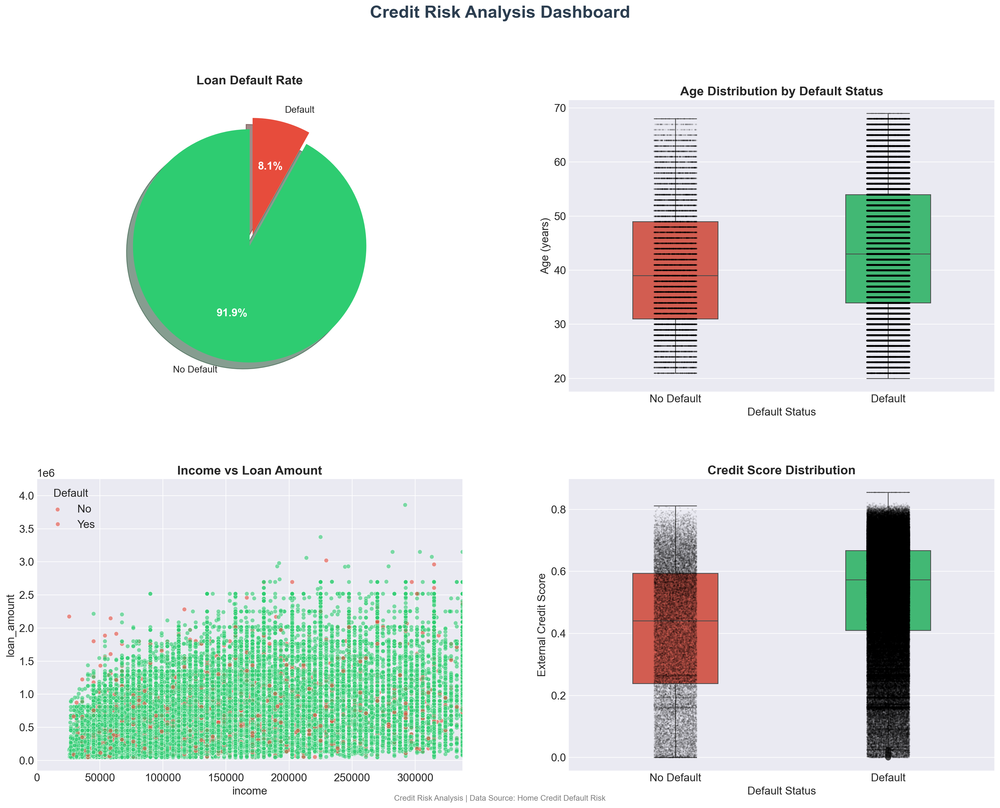

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Ensure 'default' is string type for consistent plotting
if credit_data['default'].dtype != 'object':
    credit_data['default'] = credit_data['default'].astype(str)

# Set up the figure
plt.figure(figsize=(18, 14))
plt.suptitle('Credit Risk Analysis Dashboard', 
             fontsize=22, y=1.02, fontweight='bold', color='#2c3e50')

# 1. Default rate (Pie chart)
plt.subplot(2, 2, 1)
default_counts = credit_data['default'].value_counts()
colors = ['#2ecc71', '#e74c3c']
explode = (0, 0.1)  # Explode the 2nd slice

wedges, texts, autotexts = plt.pie(
    default_counts.values, 
    labels=['No Default', 'Default'], 
    autopct='%1.1f%%', 
    colors=colors, 
    startangle=90,
    explode=explode,
    shadow=True,
    textprops={'fontsize': 12}
)

# Customize the pie chart
plt.setp(autotexts, size=14, weight="bold", color='white')
plt.title('Loan Default Rate', fontsize=16, fontweight='bold', pad=20)

# 2. Age distribution (Boxplot)
plt.subplot(2, 2, 2)
sns.boxplot(
    x='default', 
    y='age', 
    data=credit_data,
    palette={'0': '#2ecc71', '1': '#e74c3c'},  # Using strings as keys
    width=0.4
)

# Add jittered points
sns.stripplot(
    x='default', 
    y='age', 
    data=credit_data,
    color='black', 
    alpha=0.1,
    size=2,
    jitter=True
)

plt.xticks([0, 1], ['No Default', 'Default'])
plt.title('Age Distribution by Default Status', fontsize=16, fontweight='bold')
plt.xlabel('Default Status')
plt.ylabel('Age (years)')

# 3. Income vs Loan Amount (Scatter plot)
plt.subplot(2, 2, 3)
sns.scatterplot(
    x='income', 
    y='loan_amount', 
    hue='default',
    data=credit_data,
    palette={'0': '#2ecc71', '1': '#e74c3c'},
    alpha=0.6,
    s=30
)

# Format axes
plt.xlim(0, credit_data['income'].quantile(0.95))
plt.title('Income vs Loan Amount', fontsize=16, fontweight='bold')
plt.legend(title='Default', labels=['No', 'Yes'])

# 4. External scores (Boxplot)
plt.subplot(2, 2, 4)
sns.boxplot(
    x='default', 
    y='EXT_SOURCE_2', 
    data=credit_data,
    palette={'0': '#2ecc71', '1': '#e74c3c'},
    width=0.4
)

# Add jittered points
sns.stripplot(
    x='default', 
    y='EXT_SOURCE_2', 
    data=credit_data,
    color='black', 
    alpha=0.1,
    size=2,
    jitter=True
)

plt.xticks([0, 1], ['No Default', 'Default'])
plt.title('Credit Score Distribution', fontsize=16, fontweight='bold')
plt.xlabel('Default Status')
plt.ylabel('External Credit Score')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.9, hspace=0.3, wspace=0.25)

# Add footer
plt.figtext(
    0.5, 0.01, 
    'Credit Risk Analysis | Data Source: Home Credit Default Risk', 
    ha='center', 
    fontsize=10, 
    color='gray'
)

plt.show()

# Part 1: Understanding Decision Trees

## What is a Decision Tree?

A decision tree is like playing "20 questions" with your data. It makes predictions by asking a series of yes/no questions about the features.

### The Anatomy of a Decision Tree



[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


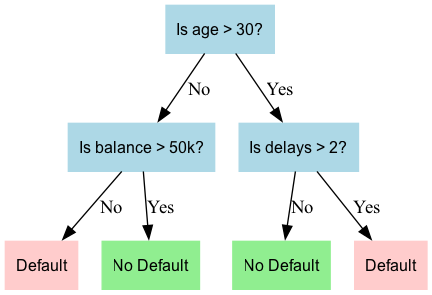

In [6]:
!pip install graphviz
from graphviz import Digraph
from IPython.display import Image, display

# Create a new directed graph
dot = Digraph(comment='Decision Tree')
dot.attr(rankdir='TB', size='8,5')  # Top to Bottom orientation

# Styling for decision nodes
dot.attr('node', shape='box', style='filled', 
         color='lightblue', fontname='Arial', fontsize='12')

# Decision nodes
dot.node('A', 'Is age > 30?')
dot.node('B', 'Is balance > 50k?')
dot.node('E', 'Is delays > 2?')

# Styling for leaf nodes
dot.attr('node', shape='box', style='filled', 
         color='lightgreen', fontname='Arial', fontsize='12')

# Leaf nodes
dot.node('C', 'Default', color='#ffcccc')  # Light red
dot.node('D', 'No Default')
dot.node('F', 'No Default')
dot.node('G', 'Default', color='#ffcccc')  # Light red

# Define edges with labels
dot.edge('A', 'B', 'No')
dot.edge('A', 'E', 'Yes')
dot.edge('B', 'C', 'No')
dot.edge('B', 'D', 'Yes')
dot.edge('E', 'F', 'No')
dot.edge('E', 'G', 'Yes')

# Display in notebook
display(Image(dot.pipe(format='png')))

# Alternative display method
# from IPython.display import SVG
# display(SVG(dot.pipe(format='svg')))

# To save the image
# dot.render('decision_tree', format='png', view=True)

### Key Components:

1. **Root Node** 🌱
   - Starting point of the tree
   - Contains all training samples
   - Makes the first split

2. **Internal Nodes** 🌿
   - Decision points in the tree
   - Each asks a question about one feature
   - Splits data into two groups

3. **Leaf Nodes** 🍃
   - Terminal nodes (no further splits)
   - Contains final prediction
   - Majority class becomes the prediction

### How Trees Make Decisions:

1. **Start at the root** with a new sample
2. **Answer the question** at each node
3. **Follow the path** based on the answer
4. **Reach a leaf** and make prediction



### Mathematical Foundation:

Trees use **information gain** or **Gini impurity** to decide splits:

- **Gini Impurity**: $G = 1 - \sum_{i=1}^{c} p_i^2$
- **Information Gain**: $IG = H(parent) - \sum_{child} \frac{N_{child}}{N_{parent}} H(child)$

Where:
- $p_i$ = proportion of samples belonging to class $i$
- $H$ = entropy
- $N$ = number of samples

In [7]:
# Prepare data for modeling
from sklearn.preprocessing import LabelEncoder

# Separate features and target
X = credit_data.drop('default', axis=1).copy()
y = credit_data['default']

# Encode categorical variables
le_gender = LabelEncoder()
le_education = LabelEncoder()
le_family = LabelEncoder()

X['gender_encoded'] = le_gender.fit_transform(X['gender'])
X['education_encoded'] = le_education.fit_transform(X['education']) 
X['family_encoded'] = le_family.fit_transform(X['family_status'])

print("📝 Categorical encodings created")
print(f"  • Gender: {list(le_gender.classes_)}")
print(f"  • Education levels: {len(le_education.classes_)}")
print(f"  • Family status: {len(le_family.classes_)}")

📝 Categorical encodings created
  • Gender: ['F', 'M', 'XNA']
  • Education levels: 5
  • Family status: 5


In [8]:
# Feature engineering
X['credit_income_ratio'] = X['loan_amount'] / (X['income'] + 1)
X['goods_loan_ratio'] = X['goods_price'] / (X['loan_amount'] + 1)
X['employ_age_ratio'] = X['years_employed'] / (X['age'] + 1)

# Drop original categorical columns
X_encoded = X.drop(['gender', 'education', 'family_status'], axis=1)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X_encoded, y, test_size=0.2, random_state=42, stratify=y
)

print(f"\n✅ Data ready for modeling!")
print(f"  • Training samples: {len(X_train):,}")
print(f"  • Test samples: {len(X_test):,}")
print(f"  • Features: {X_encoded.shape[1]}")


✅ Data ready for modeling!
  • Training samples: 245,786
  • Test samples: 61,447
  • Features: 15


# Building Our First Decision Tree


## Let's train a simple tree and see how it performs


In [9]:
# Convert target variables to integers
y_train = y_train.astype(int)
y_test = y_test.astype(int)

# Train a decision tree
simple_tree = DecisionTreeClassifier(
    max_depth=3,             # Shallow tree to prevent overfitting
    random_state=42,
    min_samples_split=50,    # Require 50 samples to split
    min_samples_leaf=20      # At least 20 samples in leaves
)

# Fit the model
simple_tree.fit(X_train, y_train)

# Make predictions
y_pred = simple_tree.predict(X_test)

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred)
f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

# Print results
print("🎯 Decision Tree Performance:")
print(f"  • Accuracy: {accuracy:.3f}")
print(f"  • Precision: {precision:.3f}")
print(f"  • Recall: {recall:.3f}")
print(f"  • F1-Score: {f1:.3f}\n")

# Additional detailed report
print("📊 Classification Report:")
print(classification_report(y_test, y_pred, target_names=['No Default', 'Default']))

# Confusion matrix
print("\n🔍 Confusion Matrix:")
conf_matrix = pd.crosstab(y_test, y_pred, 
                         rownames=['Actual'], 
                         colnames=['Predicted'],
                         margins=True)
display(conf_matrix)

🎯 Decision Tree Performance:
  • Accuracy: 0.919
  • Precision: 0.000
  • Recall: 0.000
  • F1-Score: 0.000

📊 Classification Report:
              precision    recall  f1-score   support

  No Default       0.92      1.00      0.96     56486
     Default       0.00      0.00      0.00      4961

    accuracy                           0.92     61447
   macro avg       0.46      0.50      0.48     61447
weighted avg       0.85      0.92      0.88     61447


🔍 Confusion Matrix:


Predicted,0,All
Actual,,
0,56486,56486
1,4961,4961
All,61447,61447


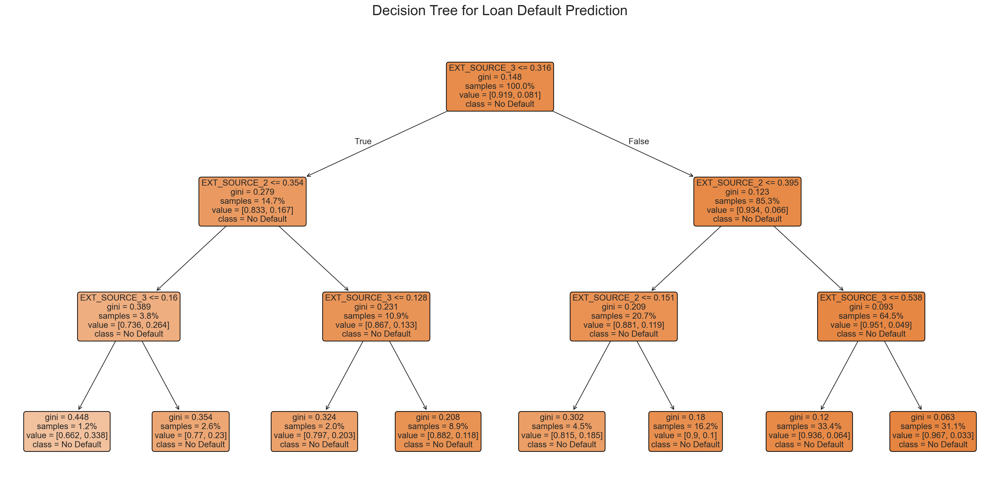

In [13]:
# Visualize the tree
plt.figure(figsize=(20, 10))
plot_tree(simple_tree, 
          feature_names=X_encoded.columns,
          class_names=['No Default', 'Default'],
          filled=True,
          rounded=True,
          fontsize=12,
          proportion=True)  # Show proportions
plt.title("Decision Tree for Loan Default Prediction", fontsize=20, pad=20)
plt.tight_layout()
plt.show()

## Which Features Matter Most?


### Trees naturally rank feature importance

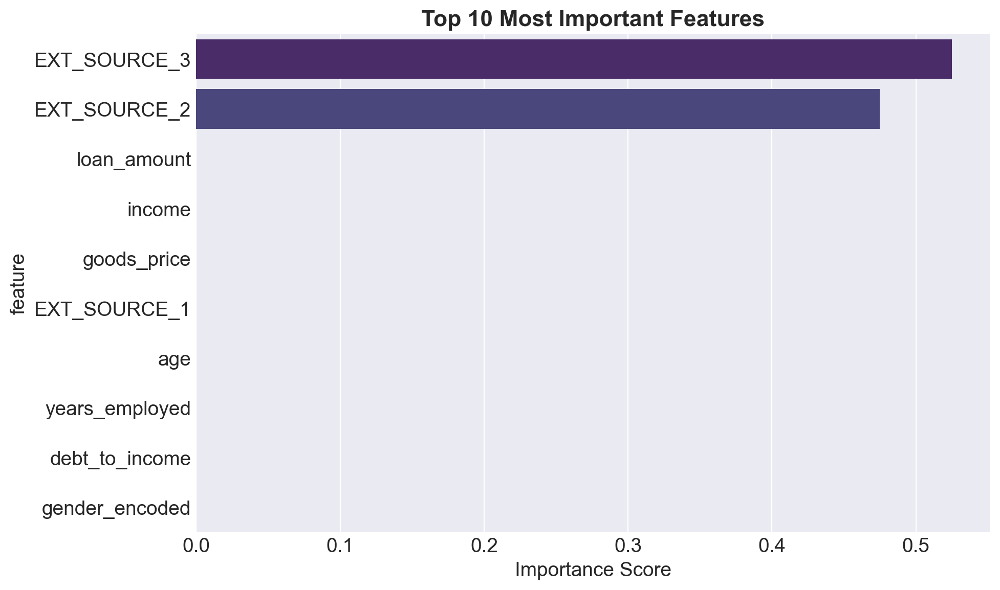

🔍 Top 3 features:
  • EXT_SOURCE_3: 0.525
  • EXT_SOURCE_2: 0.475
  • loan_amount: 0.000


In [14]:
# Feature importance analysis
feature_importance = pd.DataFrame({
    'feature': X_encoded.columns,
    'importance': simple_tree.feature_importances_
}).sort_values('importance', ascending=False).head(10)

# Visualization
plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance, x='importance', y='feature', palette='viridis')
plt.title('Top 10 Most Important Features', fontsize=16, fontweight='bold')
plt.xlabel('Importance Score')
plt.tight_layout()
plt.show()

# Key insights
top_3 = feature_importance.head(3)
print("🔍 Top 3 features:")
for _, row in top_3.iterrows():
    print(f"  • {row['feature']}: {row['importance']:.3f}")

# Deep Dive: Understanding Decision Boundaries



## What are Decision Boundaries?

Decision boundaries are the **dividing lines** (or surfaces in higher dimensions) that separate different classes in the feature space. They represent where the model "changes its mind" about predictions.



### Real-World Analogy:
Imagine you're a bank manager deciding who gets a loan:
- You draw a line: "Anyone with income > $50K AND credit score > 700 gets approved"
- This creates a **boundary** in the income-credit score space
- Everyone on one side gets approved, everyone on the other side gets rejected

# Characteristics of Tree Decision Boundaries

## 1. **Axis-Aligned Splits** 

Trees can only split parallel to feature axes

## 2. **Hierarchical Partitioning** 

Each split subdivides existing regions:
- Root split: Divides entire space
- Child splits: Further subdivide each region
- Deeper levels = More complex boundaries



## 3. **Rectangular Regions** 

The combination of axis-aligned splits creates rectangles (or hyper-rectangles in higher dimensions)

🔍 Visualizing boundaries using: EXT_SOURCE_3 vs EXT_SOURCE_2


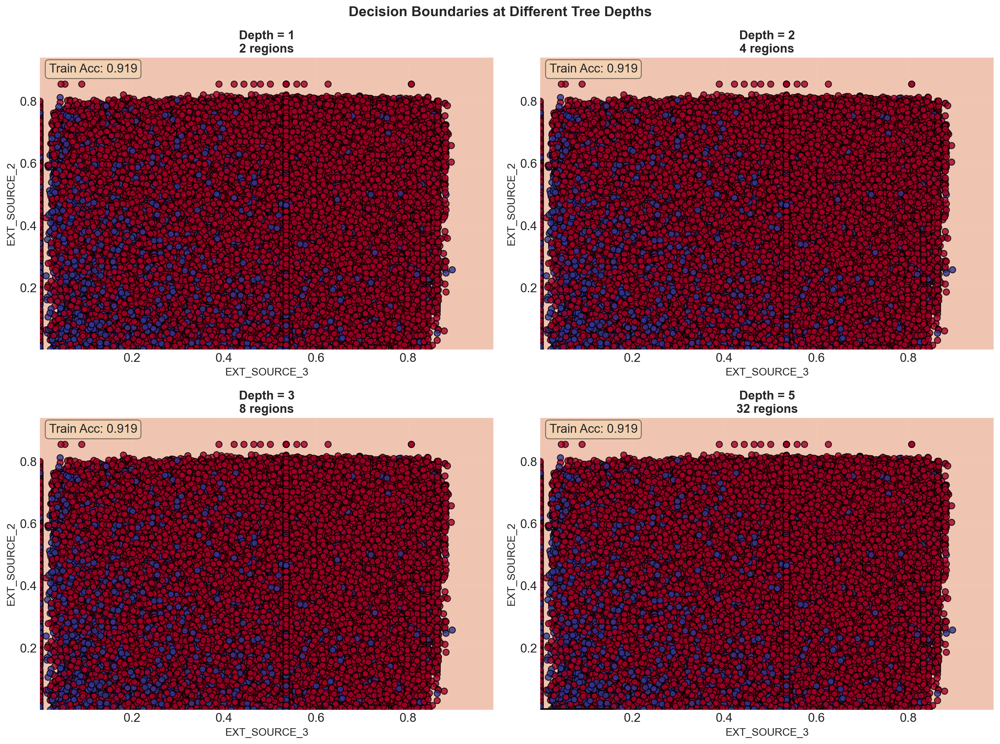


📊 Key Observations:
• Depth 1: Single split, two regions
• Depth 2: Up to 4 regions possible
• Depth 3: Up to 8 regions, more complex boundaries
• Depth 5: Many small regions, risk of overfitting!


In [16]:
# Detailed decision boundary visualization
# Using two most important features for 2D visualization

# Get feature importance first
feature_importance = pd.DataFrame({
    'feature': X_encoded.columns,
    'importance': simple_tree.feature_importances_
}).sort_values('importance', ascending=False)

# Select top 2 features
top_features = feature_importance.head(2)['feature'].tolist()
print(f"🔍 Visualizing boundaries using: {top_features[0]} vs {top_features[1]}")

# Get column indices of top features
col_indices = [X_encoded.columns.get_loc(feature) for feature in top_features]

# Convert to NumPy array if it's a DataFrame
if hasattr(X_train, 'values'):
    X_train_np = X_train.values
else:
    X_train_np = X_train

# Create 2D dataset using column indices
X_2d = X_train_np[:, col_indices]  # Now this will work with NumPy array
y_2d = y_train.values if hasattr(y_train, 'values') else y_train


# Train trees with different depths
depths = [1, 2, 3, 5]
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()

for idx, depth in enumerate(depths):
    # Train tree
    tree_2d = DecisionTreeClassifier(max_depth=depth, random_state=42)
    tree_2d.fit(X_2d, y_2d)
    
    # Create mesh
    h = 0.02  # Step size
    margin = 0.1  # Margin around data
    x_min, x_max = X_2d[:, 0].min() * (1-margin), X_2d[:, 0].max() * (1+margin)
    y_min, y_max = X_2d[:, 1].min() * (1-margin), X_2d[:, 1].max() * (1+margin)
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    
    # Predict on mesh
    Z = tree_2d.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # Plot
    ax = axes[idx]
    
    # Decision regions
    ax.contourf(xx, yy, Z, alpha=0.4, cmap='RdYlBu', levels=[0, 0.5, 1])
    
    # Add contour lines for boundaries
    ax.contour(xx, yy, Z, colors='black', linewidths=2, levels=[0.5])
    
    # Plot data points
    scatter = ax.scatter(X_2d[:, 0], X_2d[:, 1], c=y_2d, 
                        cmap='RdYlBu', edgecolor='black', 
                        s=50, alpha=0.8)
    
    # Titles and labels
    ax.set_xlabel(top_features[0], fontsize=12)
    ax.set_ylabel(top_features[1], fontsize=12)
    ax.set_title(f'Depth = {depth}\n{tree_2d.get_n_leaves()} regions', 
                 fontsize=14, fontweight='bold')
    
    # Add grid
    ax.grid(True, alpha=0.3)
    
    # Add text showing accuracy
    train_acc = tree_2d.score(X_2d, y_2d)
    ax.text(0.02, 0.98, f'Train Acc: {train_acc:.3f}', 
            transform=ax.transAxes, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.suptitle('Decision Boundaries at Different Tree Depths', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n📊 Key Observations:")
print("• Depth 1: Single split, two regions")
print("• Depth 2: Up to 4 regions possible")
print("• Depth 3: Up to 8 regions, more complex boundaries")
print("• Depth 5: Many small regions, risk of overfitting!")

# The Overfitting Problem


## Trees can memorize training data too well


### Let's see this in action...

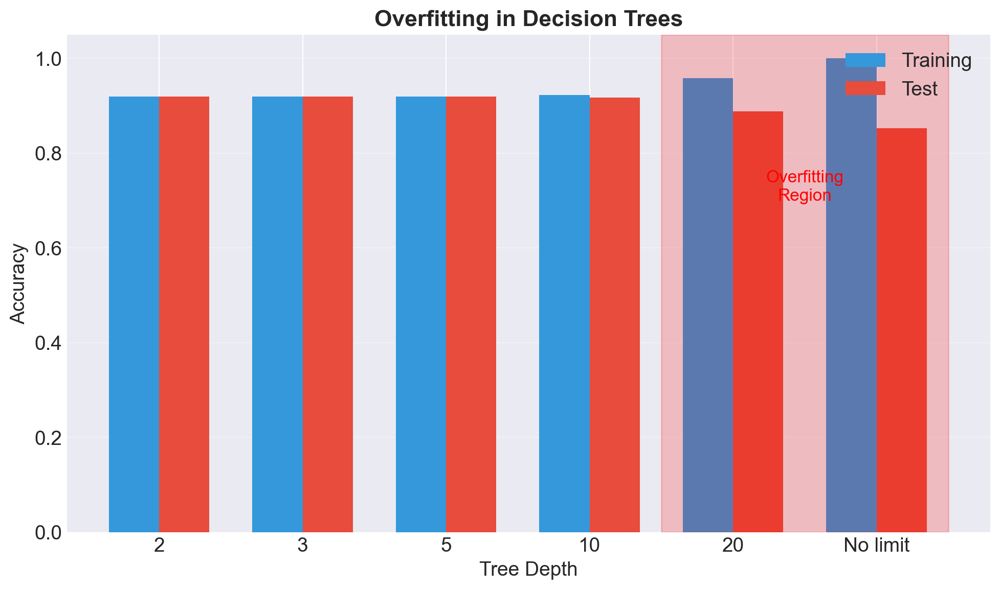

In [17]:
# Compare different tree depths
depths = [2, 3, 5, 10, 20, None]
results = []

for depth in depths:
    tree = DecisionTreeClassifier(max_depth=depth, random_state=42)
    tree.fit(X_train, y_train)
    
    train_acc = tree.score(X_train, y_train)
    test_acc = tree.score(X_test, y_test)
    
    results.append({
        'depth': str(depth) if depth else 'No limit',
        'train_acc': train_acc,
        'test_acc': test_acc,
        'gap': train_acc - test_acc
    })

results_df = pd.DataFrame(results)

# Visualization
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(results_df))
width = 0.35

bars1 = ax.bar(x - width/2, results_df['train_acc'], width, label='Training', color='#3498db')
bars2 = ax.bar(x + width/2, results_df['test_acc'], width, label='Test', color='#e74c3c')

ax.set_xlabel('Tree Depth', fontsize=14)
ax.set_ylabel('Accuracy', fontsize=14)
ax.set_title('Overfitting in Decision Trees', fontsize=16, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(results_df['depth'])
ax.legend()
ax.grid(True, alpha=0.3, axis='y')

# Highlight overfitting
ax.axvspan(3.5, 5.5, alpha=0.2, color='red')
ax.text(4.5, 0.7, 'Overfitting\nRegion', ha='center', fontsize=12, color='red')

plt.tight_layout()
plt.show()

## What Really Happens When Trees Overfit?


### The Memorization Problem:

When a tree grows too deep, it starts to:
1. **Create a unique path** for almost every training example
2. **Fit the noise** in the data, not just the signal
3. **Lose generalization** ability


### Mathematical Perspective:

**Training Error**: $E_{train} = \frac{1}{n}\sum_{i=1}^{n} L(y_i, \hat{y}_i)$

**Test Error**: $E_{test} = E[L(y, \hat{y})]$ over new data

**Overfitting occurs when**: $E_{train} \ll E_{test}$

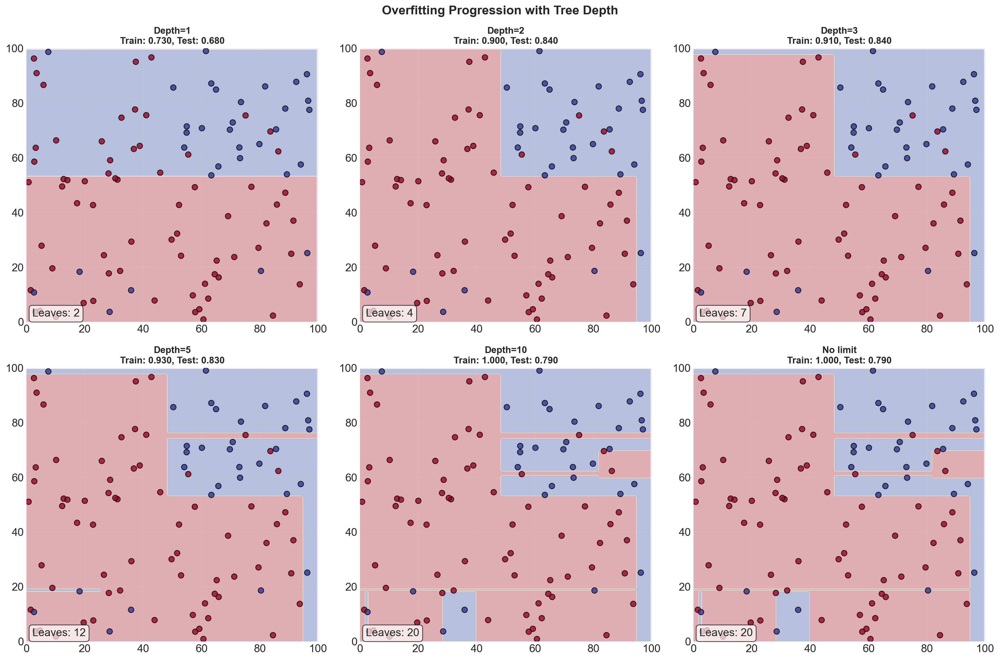

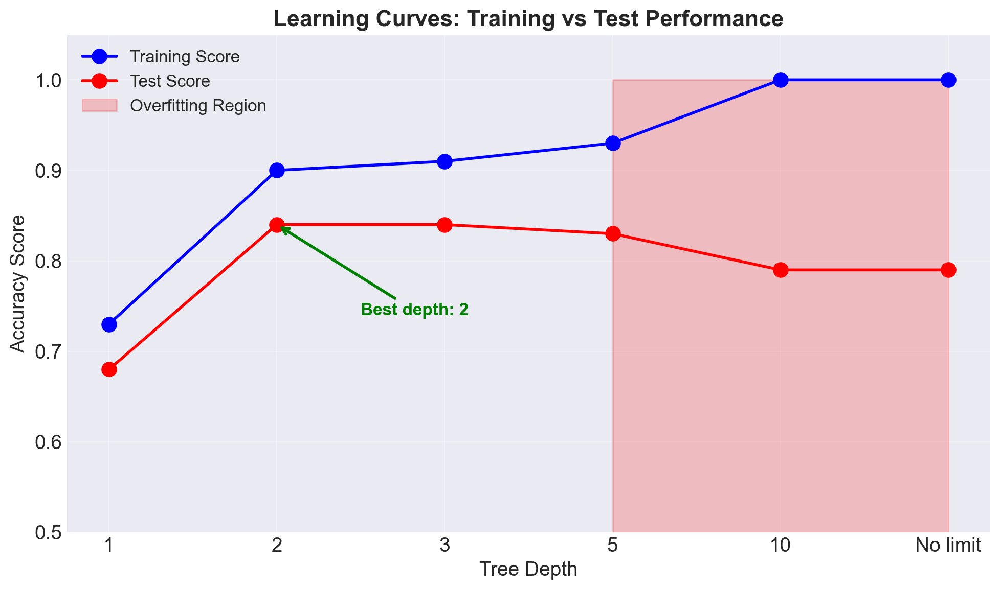

🔍 Analysis:
• Best test performance at depth: 2
• Training accuracy keeps increasing: 1.000
• But test accuracy peaks and drops: 0.790
• Overfitting gap at max depth: 0.210


In [18]:
# Create a dataset with some noise
np.random.seed(42)

n_samples = 200
X_demo = np.random.rand(n_samples, 2) * 100

# Create a non-linear pattern
y_demo = ((X_demo[:, 0] > 50) & (X_demo[:, 1] > 50)).astype(int)

# Add 10% noise - FIXED
noise_mask = np.random.rand(n_samples) < 0.1
y_demo[noise_mask] = 1 - y_demo[noise_mask]  # Flip the labels where mask is True

# Split data
X_train_demo, X_test_demo, y_train_demo, y_test_demo = train_test_split(
    X_demo, y_demo, test_size=0.5, random_state=42
)

# Train trees with different complexities
depths = [1, 2, 3, 5, 10, None]
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

train_scores = []
test_scores = []

for idx, depth in enumerate(depths):
    # Train tree
    tree = DecisionTreeClassifier(max_depth=depth, random_state=42)
    tree.fit(X_train_demo, y_train_demo)
    
    # Calculate scores
    train_score = tree.score(X_train_demo, y_train_demo)
    test_score = tree.score(X_test_demo, y_test_demo)
    train_scores.append(train_score)
    test_scores.append(test_score)
    
    # Create mesh for visualization
    h = 0.5
    xx, yy = np.meshgrid(np.arange(0, 100, h), np.arange(0, 100, h))
    Z = tree.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # Plot
    ax = axes[idx]
    ax.contourf(xx, yy, Z, alpha=0.3, cmap='RdYlBu')
    
    # Plot training points
    ax.scatter(X_train_demo[:, 0], X_train_demo[:, 1], c=y_train_demo, 
              cmap='RdYlBu', edgecolor='black', s=50, alpha=0.8)
    
    # Title with scores
    depth_str = f"Depth={depth}" if depth else "No limit"
    ax.set_title(f'{depth_str}\nTrain: {train_score:.3f}, Test: {test_score:.3f}',
                fontsize=12, fontweight='bold')
    
    # Add number of leaves
    ax.text(0.02, 0.02, f'Leaves: {tree.get_n_leaves()}', 
            transform=ax.transAxes,
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    ax.set_xlim(0, 100)
    ax.set_ylim(0, 100)
    ax.grid(True, alpha=0.3)

plt.suptitle('Overfitting Progression with Tree Depth', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Learning curves
plt.figure(figsize=(10, 6))
depth_labels = [str(d) if d else 'No limit' for d in depths]
x_pos = np.arange(len(depths))

plt.plot(x_pos, train_scores, 'o-', label='Training Score', 
         linewidth=2, markersize=10, color='blue')
plt.plot(x_pos, test_scores, 'o-', label='Test Score', 
         linewidth=2, markersize=10, color='red')

# Highlight overfitting region
plt.fill_between(x_pos[3:], 0, 1, alpha=0.2, color='red', 
                label='Overfitting Region')

plt.xticks(x_pos, depth_labels)
plt.xlabel('Tree Depth', fontsize=14)
plt.ylabel('Accuracy Score', fontsize=14)
plt.title('Learning Curves: Training vs Test Performance', fontsize=16, fontweight='bold')
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.ylim(0.5, 1.05)

# Add annotations
best_idx = np.argmax(test_scores)
plt.annotate(f'Best depth: {depth_labels[best_idx]}', 
             xy=(best_idx, test_scores[best_idx]),
             xytext=(best_idx+0.5, test_scores[best_idx]-0.1),
             arrowprops=dict(arrowstyle='->', color='green', lw=2),
             fontsize=12, color='green', fontweight='bold')

plt.tight_layout()
plt.show()

print("🔍 Analysis:")
print(f"• Best test performance at depth: {depth_labels[best_idx]}")
print(f"• Training accuracy keeps increasing: {train_scores[-1]:.3f}")
print(f"• But test accuracy peaks and drops: {test_scores[-1]:.3f}")
print(f"• Overfitting gap at max depth: {train_scores[-1] - test_scores[-1]:.3f}")

# Part 2: Enter XGBoost


## **The Game Changer in Machine Learning**
 

### From Weak Trees to Strong Predictions

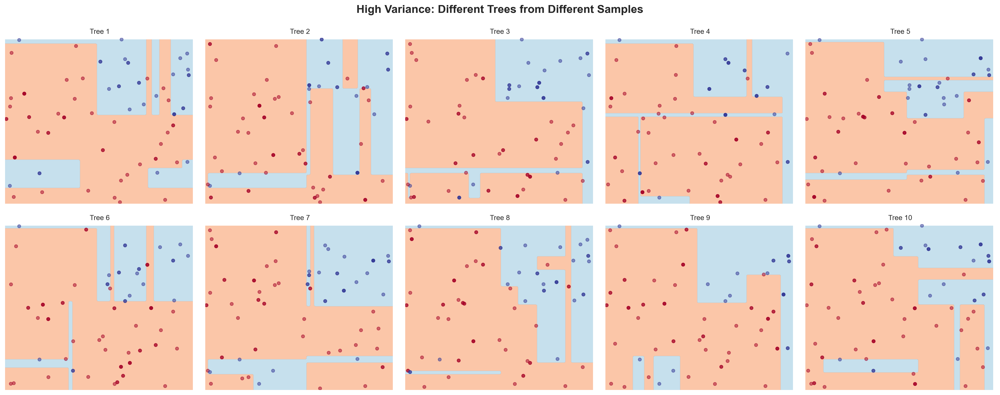

📊 Notice how different each tree looks!
This is HIGH VARIANCE - the model is too sensitive to training data
Solution: Ensemble methods like Random Forest or XGBoost!


In [19]:
# Visualize variance by training multiple trees on different samples
n_trees = 10
n_samples_per_tree = 80

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.ravel()

# Train multiple trees on different bootstrap samples
for i in range(n_trees):
    # Bootstrap sample
    idx = np.random.choice(len(X_train_demo), n_samples_per_tree, replace=True)
    X_boot = X_train_demo[idx]
    y_boot = y_train_demo[idx]
    
    # Train deep tree
    tree = DecisionTreeClassifier(max_depth=10, random_state=i)
    tree.fit(X_boot, y_boot)
    
    # Visualize
    h = 1.0
    xx, yy = np.meshgrid(np.arange(0, 100, h), np.arange(0, 100, h))
    Z = tree.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    ax = axes[i]
    ax.contourf(xx, yy, Z, alpha=0.5, cmap='RdYlBu', levels=[0, 0.5, 1])
    ax.scatter(X_boot[:, 0], X_boot[:, 1], c=y_boot, 
              cmap='RdYlBu', s=20, alpha=0.5)
    ax.set_title(f'Tree {i+1}', fontsize=10)
    ax.set_xlim(0, 100)
    ax.set_ylim(0, 100)
    ax.axis('off')

plt.suptitle('High Variance: Different Trees from Different Samples', 
            fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("📊 Notice how different each tree looks!")
print("This is HIGH VARIANCE - the model is too sensitive to training data")
print("Solution: Ensemble methods like Random Forest or XGBoost!")

# Practical Tips to Avoid Overfitting

 

## 1. **Regularization Parameters**  

```python
tree = DecisionTreeClassifier(
    max_depth=5,           # Limit tree depth
    min_samples_split=20,  # Need 20+ samples to split
    min_samples_leaf=10,   # Each leaf needs 10+ samples
    max_features='sqrt'    # Only consider sqrt(n) features
)
```

<br>

## 2. **Pruning Strategies**  

- **Pre-pruning**: Stop growing early (what sklearn does)
- **Post-pruning**: Grow full tree, then remove branches

<br>

## 3. **Validation Strategies**  

- **Train/Val/Test split**: Monitor validation performance
- **Cross-validation**: More robust performance estimates
- **Early stopping**: Stop when validation performance plateaus

<br>

## 4. **Ensemble Methods**  

- **Random Forest**: Average many trees (reduce variance)
- **XGBoost**: Sequential correction (reduce bias and variance)

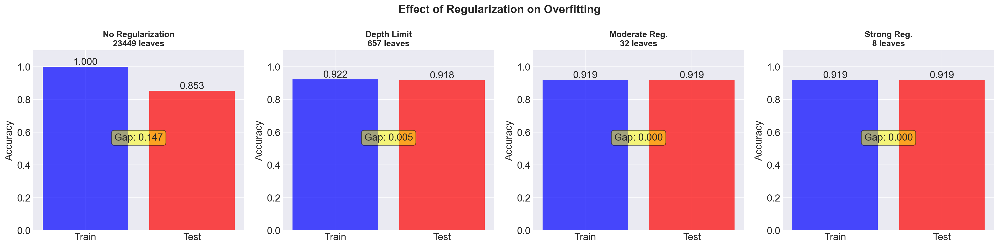

🎯 Key Takeaways:
• No regularization → Large gap (overfitting)
• Moderate regularization → Balanced performance
• Too much regularization → Underfitting (both scores drop)


In [20]:
# Demonstrate regularization effects
regularization_params = [
    {'max_depth': None, 'min_samples_split': 2, 'min_samples_leaf': 1},
    {'max_depth': 10, 'min_samples_split': 2, 'min_samples_leaf': 1},
    {'max_depth': 5, 'min_samples_split': 10, 'min_samples_leaf': 5},
    {'max_depth': 3, 'min_samples_split': 20, 'min_samples_leaf': 10}
]

labels = ['No Regularization', 'Depth Limit', 'Moderate Reg.', 'Strong Reg.']

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for idx, (params, label) in enumerate(zip(regularization_params, labels)):
    # Train tree
    tree = DecisionTreeClassifier(**params, random_state=42)
    tree.fit(X_train, y_train)
    
    # Calculate metrics
    train_acc = tree.score(X_train, y_train)
    test_acc = tree.score(X_test, y_test)
    n_leaves = tree.get_n_leaves()
    
    # Plot tree structure (simplified)
    ax = axes[idx]
    
    # Bar plot of accuracies
    bars = ax.bar(['Train', 'Test'], [train_acc, test_acc], 
                   color=['blue', 'red'], alpha=0.7)
    
    # Add value labels
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}', ha='center', va='bottom')
    
    # Title and labels
    ax.set_title(f'{label}\n{n_leaves} leaves', fontsize=12, fontweight='bold')
    ax.set_ylim(0, 1.1)
    ax.set_ylabel('Accuracy')
    
    # Add overfitting gap
    gap = train_acc - test_acc
    ax.text(0.5, 0.5, f'Gap: {gap:.3f}', 
            transform=ax.transAxes, ha='center',
            bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.5))

plt.suptitle('Effect of Regularization on Overfitting', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("🎯 Key Takeaways:")
print("• No regularization → Large gap (overfitting)")
print("• Moderate regularization → Balanced performance")
print("• Too much regularization → Underfitting (both scores drop)")

## Why XGBoost

### Problems with Single Trees:
- ❌ High variance
- ❌ Overfitting
- ❌ Limited complexity


### XGBoost Solution:
- ✅ **Gradient Boosting**: Trees learn from mistakes
- ✅ **Regularization**: Built-in overfitting prevention
- ✅ **Engineering**: Blazing fast performance

In [21]:
# Install and import XGBoost
!pip install -q xgboost
import xgboost as xgb

print("✅ XGBoost ready!")
print(f"Version: {xgb.__version__}")


[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
✅ XGBoost ready!
Version: 3.0.2


[0]	validation_0-logloss:0.68104	validation_1-logloss:0.68093
[10]	validation_0-logloss:0.62668	validation_1-logloss:0.62637
[20]	validation_0-logloss:0.60802	validation_1-logloss:0.60790
[30]	validation_0-logloss:0.59952	validation_1-logloss:0.59973
[40]	validation_0-logloss:0.59495	validation_1-logloss:0.59536
[50]	validation_0-logloss:0.59118	validation_1-logloss:0.59175
[60]	validation_0-logloss:0.58827	validation_1-logloss:0.58904
[70]	validation_0-logloss:0.58672	validation_1-logloss:0.58771
[80]	validation_0-logloss:0.58528	validation_1-logloss:0.58647
[90]	validation_0-logloss:0.58388	validation_1-logloss:0.58532
[100]	validation_0-logloss:0.58281	validation_1-logloss:0.58443
[110]	validation_0-logloss:0.58172	validation_1-logloss:0.58362
[120]	validation_0-logloss:0.58049	validation_1-logloss:0.58262
[130]	validation_0-logloss:0.57963	validation_1-logloss:0.58194
[140]	validation_0-logloss:0.57897	validation_1-logloss:0.58146
[150]	validation_0-logloss:0.57788	validation_1-log

,feature,importance
4,EXT_SOURCE_2,0.205308
5,EXT_SOURCE_3,0.180071
10,education_encoded,0.105082
9,gender_encoded,0.089033
3,EXT_SOURCE_1,0.069273
13,goods_loan_ratio,0.055773
6,age,0.047530
2,goods_price,0.041261
7,years_employed,0.039857
0,loan_amount,0.037751


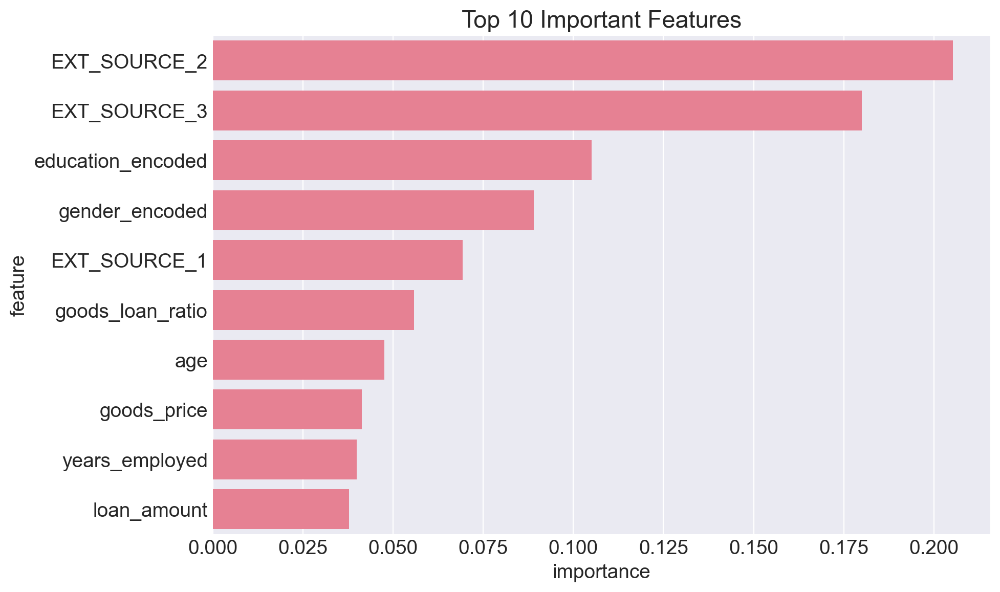

In [22]:

# Train XGBoost model
xgb_model = xgb.XGBClassifier(
    n_estimators=1000,  # Set a higher number since we're using early stopping
    max_depth=4,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    scale_pos_weight=len(y_train[y_train==0]) / len(y_train[y_train==1]),
    random_state=42,
    eval_metric='logloss',
    early_stopping_rounds=10,  # Moved from fit to here
    use_label_encoder=False  # Important: disable label encoder
)

# Training with early stopping
xgb_model.fit(
    X_train, 
    y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)],
    verbose=10  # Shows progress every 10 iterations
)

# Get the best iteration
best_iteration = xgb_model.best_iteration
print(f"Best iteration: {best_iteration}")

# Evaluate
xgb_pred = xgb_model.predict(X_test, iteration_range=(0, best_iteration))
xgb_accuracy = accuracy_score(y_test, xgb_pred)

# Get probabilities for AUC-ROC if needed
xgb_proba = xgb_model.predict_proba(X_test)[:, 1]

# Print comparison
print("\n🎯 Model Comparison:")
print(f"  • Decision Tree: {accuracy:.3f}")
print(f"  • XGBoost: {xgb_accuracy:.3f}")
print(f"  • Improvement: +{((xgb_accuracy - accuracy) / accuracy * 100 if accuracy > 0 else 0):.1f}%")

# Detailed classification report
print("\n📊 XGBoost Classification Report:")
print(classification_report(y_test, xgb_pred, target_names=['No Default', 'Default']))

# Feature importance
feature_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': xgb_model.feature_importances_
}).sort_values('importance', ascending=False)

print("\n🔍 Top 10 Important Features:")
display(feature_importance.head(10))

# Plot feature importance (optional)
plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance.head(10))
plt.title('Top 10 Important Features')
plt.tight_layout()
plt.show()

# Comparing Tree-Based Methods


## Let's see how different approaches stack up


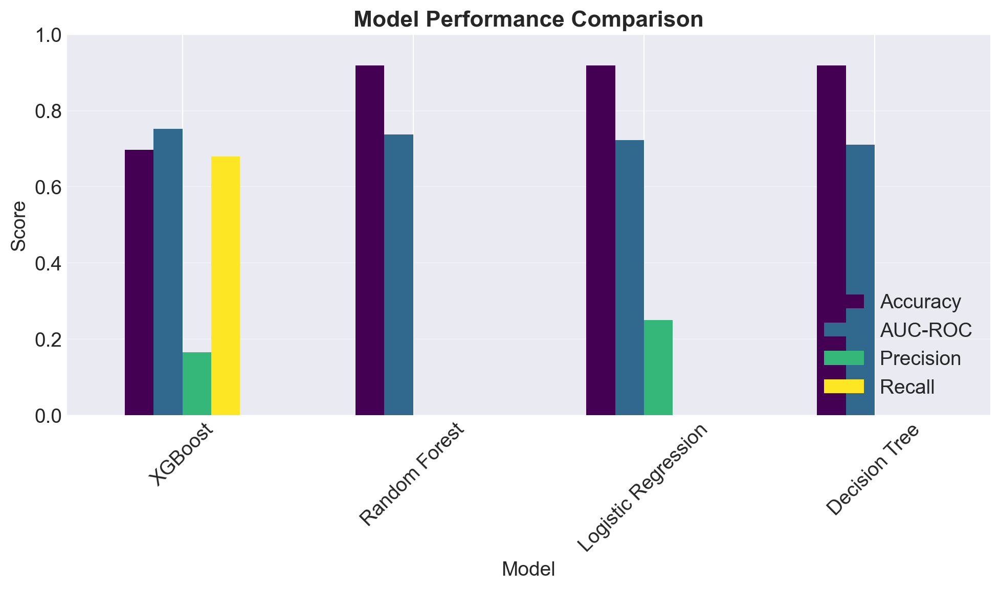

In [23]:
# Compare multiple models
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(max_depth=5),
    'Random Forest': RandomForestClassifier(n_estimators=100, max_depth=5),
    'XGBoost': xgb_model
}

# Train and evaluate
comparison_results = []
for name, model in models.items():
    if name != 'XGBoost':  # Already trained
        model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]
    
    comparison_results.append({
        'Model': name,
        'Accuracy': accuracy_score(y_test, y_pred),
        'AUC-ROC': roc_auc_score(y_test, y_proba),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred)
    })

comparison_df = pd.DataFrame(comparison_results)
comparison_df = comparison_df.sort_values('AUC-ROC', ascending=False)

# Visualization
fig, ax = plt.subplots(figsize=(10, 6))
comparison_df.set_index('Model')[['Accuracy', 'AUC-ROC', 'Precision', 'Recall']].plot(
    kind='bar', ax=ax, colormap='viridis'
)
ax.set_title('Model Performance Comparison', fontsize=16, fontweight='bold')
ax.set_ylabel('Score')
ax.set_ylim(0, 1)
ax.legend(loc='lower right')
ax.grid(True, alpha=0.3, axis='y')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Building robust, deployable models


In [24]:
# Create preprocessing pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Define feature groups
numeric_features = ['loan_amount', 'income', 'goods_price', 'age', 
                   'years_employed', 'debt_to_income',
                   'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
                   'credit_income_ratio', 'goods_loan_ratio', 'employ_age_ratio']

categorical_features = ['gender_encoded', 'education_encoded', 'family_encoded']

# Preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', 'passthrough', categorical_features)
    ])

print("✅ Preprocessing pipeline created")

✅ Preprocessing pipeline created


📊 Pipeline AUC-ROC: 0.753


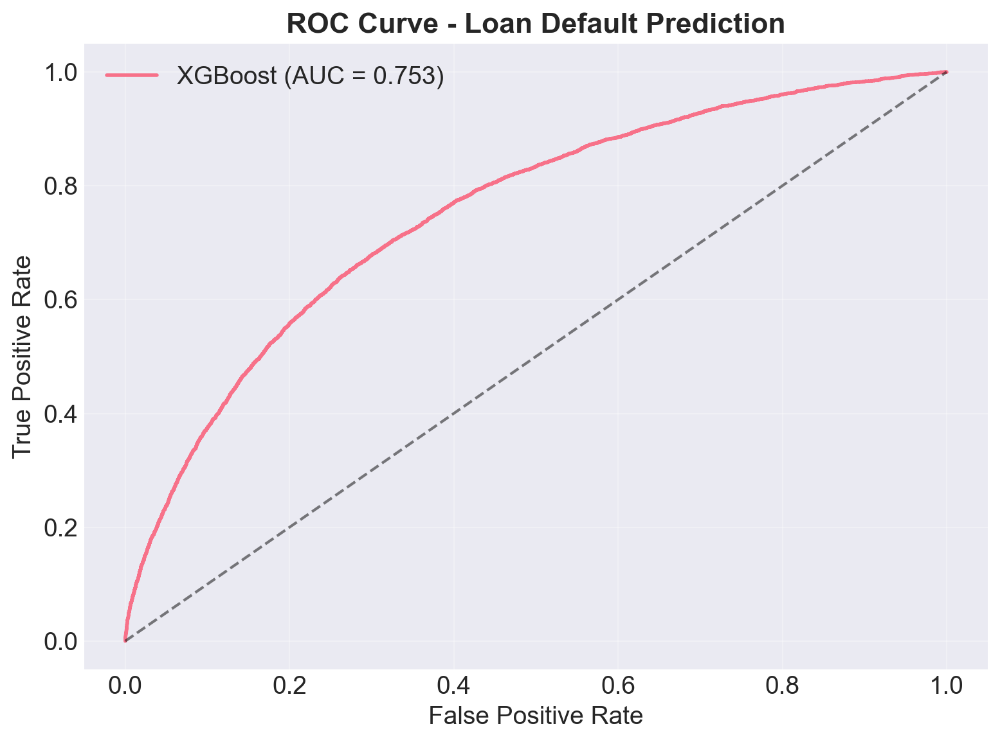

In [25]:
# Complete pipeline with XGBoost
xgb_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', xgb.XGBClassifier(
        n_estimators=200,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        scale_pos_weight=len(y_train[y_train==0]) / len(y_train[y_train==1]),
        random_state=42
    ))
])

# Train pipeline
xgb_pipeline.fit(X_train, y_train)

# Evaluate
y_pred_pipeline = xgb_pipeline.predict(X_test)
y_pred_proba = xgb_pipeline.predict_proba(X_test)[:, 1]

from sklearn.metrics import roc_auc_score, roc_curve

pipeline_auc = roc_auc_score(y_test, y_pred_proba)
print(f"📊 Pipeline AUC-ROC: {pipeline_auc:.3f}")

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'XGBoost (AUC = {pipeline_auc:.3f})', linewidth=2)
plt.plot([0, 1], [0, 1], 'k--', alpha=0.5)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Loan Default Prediction', fontsize=16, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

#  Making Predictions


## Creating an interpretable prediction system

In [26]:
def predict_loan_default(loan_amount, income, age, years_employed, 
                        ext_score_1, ext_score_2, ext_score_3,
                        gender='M', education='Higher education', 
                        family='Married'):
    """Predict loan default probability"""
    
    # Create input
    input_data = pd.DataFrame({
        'loan_amount': [loan_amount],
        'income': [income],
        'goods_price': [loan_amount * 0.9],  # Typical ratio
        'age': [age],
        'years_employed': [years_employed],
        'debt_to_income': [loan_amount / (income + 1)],
        'EXT_SOURCE_1': [ext_score_1],
        'EXT_SOURCE_2': [ext_score_2],
        'EXT_SOURCE_3': [ext_score_3],
        'gender_encoded': [le_gender.transform([gender])[0]],
        'education_encoded': [le_education.transform([education])[0]],
        'family_encoded': [le_family.transform([family])[0]],
        'credit_income_ratio': [loan_amount / (income + 1)],
        'goods_loan_ratio': [0.9],
        'employ_age_ratio': [years_employed / age]
    })
    
    # Predict
    prob = xgb_pipeline.predict_proba(input_data)[0, 1]
    
    # Risk assessment
    if prob > 0.5:
        risk = "🔴 HIGH RISK"
        action = "Decline or require collateral"
    elif prob > 0.2:
        risk = "🟡 MEDIUM RISK"  
        action = "Review with conditions"
    else:
        risk = "🟢 LOW RISK"
        action = "Approve"
    
    return prob, risk, action

# Example
prob, risk, action = predict_loan_default(
    loan_amount=500000, income=200000, age=35, years_employed=5,
    ext_score_1=0.5, ext_score_2=0.6, ext_score_3=0.7
)

print(f"Default Probability: {prob:.1%}")
print(f"Risk Level: {risk}")
print(f"Recommendation: {action}")

Default Probability: 29.7%
Risk Level: 🟡 MEDIUM RISK
Recommendation: Review with conditions


# Part 3: How Boosting Works


## Visualizing the magic behind XGBoost

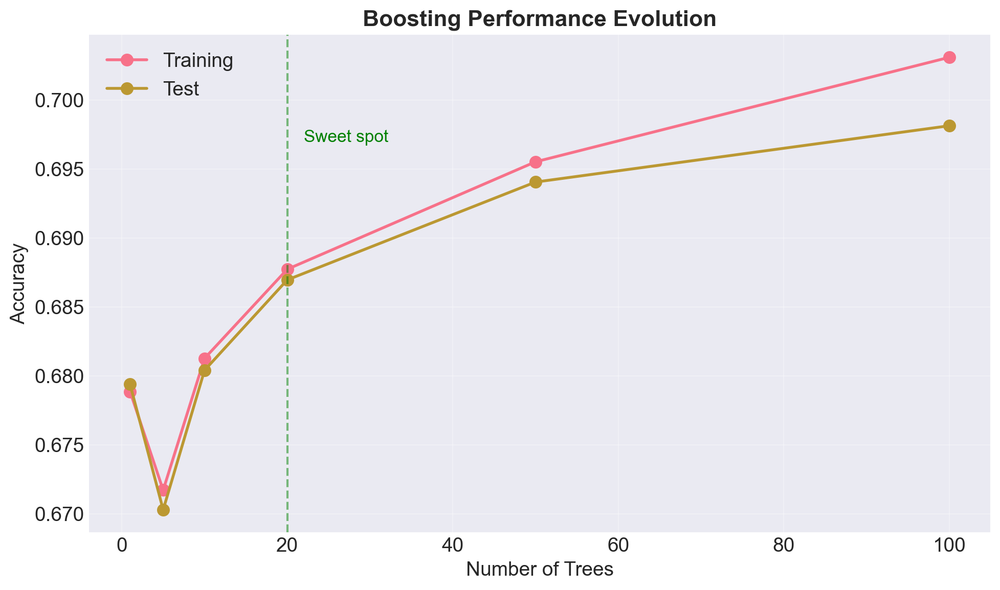

In [27]:
# Visualize boosting iterations
n_estimators_list = [1, 5, 10, 20, 50, 100]
boosting_results = []

for n in n_estimators_list:
    model = xgb.XGBClassifier(
        n_estimators=n, max_depth=4, learning_rate=0.3,
        scale_pos_weight=len(y_train[y_train==0]) / len(y_train[y_train==1]),
        random_state=42
    )
    model.fit(X_train, y_train, verbose=False)
    
    train_acc = model.score(X_train, y_train)
    test_acc = model.score(X_test, y_test)
    
    boosting_results.append({
        'Trees': n,
        'Train': train_acc,
        'Test': test_acc
    })

boosting_df = pd.DataFrame(boosting_results)

# Plot
plt.figure(figsize=(10, 6))
plt.plot(boosting_df['Trees'], boosting_df['Train'], 'o-', 
         label='Training', linewidth=2, markersize=8)
plt.plot(boosting_df['Trees'], boosting_df['Test'], 'o-', 
         label='Test', linewidth=2, markersize=8)

plt.axvline(x=20, color='green', linestyle='--', alpha=0.5)
plt.text(22, boosting_df['Test'].iloc[3] + 0.01, 'Sweet spot', 
         fontsize=12, color='green')

plt.xlabel('Number of Trees', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.title('Boosting Performance Evolution', fontsize=16, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# Feature Importance Evolution


## Watch how XGBoost learns what matters

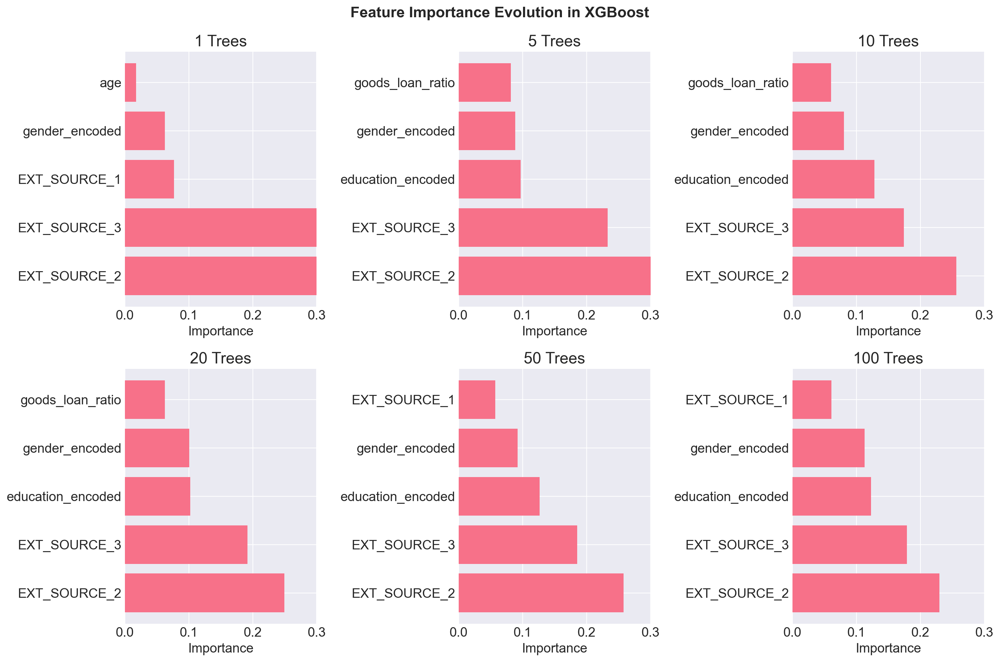

In [28]:
# Feature importance over iterations
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

for idx, n in enumerate([1, 5, 10, 20, 50, 100]):
    model = xgb.XGBClassifier(
        n_estimators=n, max_depth=4,
        scale_pos_weight=len(y_train[y_train==0]) / len(y_train[y_train==1]),
        random_state=42
    )
    model.fit(X_train, y_train, verbose=False)
    
    # Get top 5 features
    importance_df = pd.DataFrame({
        'feature': X_encoded.columns,
        'importance': model.feature_importances_
    }).nlargest(5, 'importance')
    
    # Plot
    axes[idx].barh(importance_df['feature'], importance_df['importance'])
    axes[idx].set_xlabel('Importance')
    axes[idx].set_title(f'{n} Trees')
    axes[idx].set_xlim(0, 0.3)

plt.suptitle('Feature Importance Evolution in XGBoost', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Part 4: Building XGBoost from Scratch


## Understanding by implementing


In [31]:
# Simplified gradient boosting implementation
class SimpleGradientBoosting:
    def __init__(self, n_estimators=100, learning_rate=0.1, max_depth=3):
        self.n_estimators = n_estimators
        self.learning_rate = learning_rate
        self.max_depth = max_depth
        self.trees = []
        
    def _sigmoid(self, x):
        return 1 / (1 + np.exp(-np.clip(x, -500, 500)))
    
    def _compute_gradient(self, y_true, y_pred):
        p = self._sigmoid(y_pred)
        return -(y_true - p)
    
    def _compute_hessian(self, y_pred):
        p = self._sigmoid(y_pred)
        return p * (1 - p)

    def fit(self, X, y):
        from sklearn.tree import DecisionTreeRegressor
        n_samples = X.shape[0]
        
        # Initialize with log odds
        pos_ratio = np.mean(y)
        self.init_prediction = np.log(pos_ratio / (1 - pos_ratio + 1e-7))
        y_pred = np.full(n_samples, self.init_prediction)
        
        # Build trees
        for i in range(self.n_estimators):
            # Compute gradients
            gradients = self._compute_gradient(y, y_pred)
            hessians = self._compute_hessian(y_pred)
            
            # Fit tree to gradients
            tree = DecisionTreeRegressor(max_depth=self.max_depth)
            tree.fit(X, -gradients, sample_weight=hessians)
            
            # Update predictions
            y_pred += self.learning_rate * tree.predict(X)
            self.trees.append(tree)
            
            if i % 20 == 0:
                loss = -np.mean(y * np.log(self._sigmoid(y_pred) + 1e-7) + 
                               (1-y) * np.log(1 - self._sigmoid(y_pred) + 1e-7))
                print(f"Iteration {i}: Loss = {loss:.4f}")
    
    def predict_proba(self, X):
        y_pred = np.full(X.shape[0], self.init_prediction)
        for tree in self.trees:
            y_pred += self.learning_rate * tree.predict(X)
        probs = self._sigmoid(y_pred)
        return np.column_stack([1 - probs, probs])



## Gradient Boosting Example

Let's train a simple gradient boosting model on our credit risk dataset.
We'll use early stopping to prevent overfitting.

In [32]:
# Train our implementation
print("🚀 Training custom gradient boosting...")
custom_gb = SimpleGradientBoosting(n_estimators=100, learning_rate=0.1, max_depth=3)
custom_gb.fit(X_train, y_train)  # Removed .values

# Evaluate
custom_proba = custom_gb.predict_proba(X_test)[:, 1]  # Removed .values
custom_pred = (custom_proba > 0.5).astype(int)
custom_accuracy = accuracy_score(y_test, custom_pred)

print(f"\n📊 Custom Implementation: {custom_accuracy:.3f}")
print(f"📊 XGBoost: {xgb_accuracy:.3f}")
print(f"📊 Difference: {abs(custom_accuracy - xgb_accuracy):.3f}")

🚀 Training custom gradient boosting...
Iteration 0: Loss = 0.2802
Iteration 20: Loss = 0.2747
Iteration 40: Loss = 0.2706
Iteration 60: Loss = 0.2675
Iteration 80: Loss = 0.2651

📊 Custom Implementation: 0.919
📊 XGBoost: 0.697
📊 Difference: 0.222



#  Part 5: When Neural Networks Meet Trees


## The Next Evolution: Differentiable Decision Trees



### **Key Innovation**: Making trees work with deep learning



### Why This Matters:
-  **End-to-end learning** with neural networks
-  **Smooth boundaries** instead of sharp cuts
-  **Backpropagation** through tree structure
-  **Richer representations** of complex patterns


# Traditional vs Soft Decision Trees



## Traditional (Hard) Trees:
```python
if income > 50000:
    go_right()  # 100% right
else:
    go_left()   # 100% left
```

<br>

## Soft Trees:
```python
p_right = sigmoid(w·features + b)  # e.g., 0.73
go_right(73%)  # Probabilistic!
go_left(27%)   # Both paths contribute
```

<br>

### 💡 **Key Insight**: Probabilistic routing enables gradient flow!

In [33]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler

class SoftDecisionTree(nn.Module):
    """
    A differentiable decision tree using soft routing.
    Updated for Home Credit dataset with proper scaling and regularization.
    """
    
    def __init__(self, input_dim, depth=3, num_classes=2, dropout_rate=0.1):
        super().__init__()
        self.depth = depth
        self.num_classes = num_classes
        self.num_leaves = 2 ** depth
        self.dropout_rate = dropout_rate
        
        # Decision nodes (internal nodes) with batch normalization
        self.decision_layers = nn.ModuleList()
        self.batch_norms = nn.ModuleList()
        
        for d in range(depth):
            n_nodes = 2 ** d
            layer = nn.Linear(input_dim, n_nodes)
            self.decision_layers.append(layer)
            self.batch_norms.append(nn.BatchNorm1d(input_dim))
        
        # Leaf node predictions with dropout
        self.dropout = nn.Dropout(dropout_rate)
        self.leaf_layer = nn.Linear(self.num_leaves, num_classes)
        
        # Temperature for soft routing (learnable)
        self.temperature = nn.Parameter(torch.ones(1))
        
        # Initialize weights
        self._initialize_weights()
    
    def _initialize_weights(self):
        for layer in self.decision_layers:
            nn.init.xavier_uniform_(layer.weight)
            nn.init.zeros_(layer.bias)
        nn.init.xavier_uniform_(self.leaf_layer.weight)
        nn.init.zeros_(self.leaf_layer.bias)
    
    def forward(self, x):
        batch_size = x.shape[0]
        
        # Start with all samples at root
        path_prob = torch.ones(batch_size, 1, device=x.device)
        
        # Traverse tree level by level
        for d in range(self.depth):
            # Apply batch normalization
            x_norm = self.batch_norms[d](x)
            
            # Get routing decisions with temperature scaling
            decisions = torch.sigmoid(self.decision_layers[d](x_norm) / self.temperature)
            
            # Expand path probabilities
            path_prob = path_prob.view(batch_size, -1, 1)
            
            # Probability of going left (1 - decision) and right (decision)
            path_prob = torch.cat([
                path_prob * (1 - decisions).unsqueeze(2),
                path_prob * decisions.unsqueeze(2)
            ], dim=2)
            
            path_prob = path_prob.view(batch_size, -1)
        
        # Apply dropout to leaf probabilities
        leaf_probs = self.dropout(path_prob)
        
        # Get predictions from leaves
        output = self.leaf_layer(leaf_probs)
        
        return output, path_prob

In [ ]:
# Prepare data for neural network
print("🔧 Preparing data for soft decision tree...")

# Scale features for neural network
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert to PyTorch tensors
X_train_tensor = torch.FloatTensor(X_train_scaled)
y_train_tensor = torch.LongTensor(y_train)  
X_test_tensor = torch.FloatTensor(X_test_scaled)
y_test_tensor = torch.LongTensor(y_test)    

# Create data loaders for batching
batch_size = 256
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Create model with regularization
soft_tree = SoftDecisionTree(
    input_dim=X_train.shape[1], 
    depth=3,  # Slightly deeper for complex data
    num_classes=2,
    dropout_rate=0.2
)

# Use class weights to handle imbalance
# Calculate class weights
class_0_weight = len(y_train) / (2 * len(y_train[y_train == 0]))
class_1_weight = len(y_train) / (2 * len(y_train[y_train == 1]))
class_weights = torch.FloatTensor([class_0_weight, class_1_weight])

criterion = nn.CrossEntropyLoss(weight=class_weights)

# Optimizer with weight decay
optimizer = torch.optim.Adam(soft_tree.parameters(), lr=0.001, weight_decay=0.01)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=10)

# Training with early stopping
print("🚀 Training soft decision tree on Home Credit data...")
best_val_acc = 0
patience = 20
patience_counter = 0
train_losses = []
test_accuracies = []
test_aucs = []

for epoch in range(200):
    print(f"\nEpoch {epoch+1}/200")
    # Training phase
    soft_tree.train()
    epoch_loss = 0
    
    for batch_x, batch_y in train_loader:
        outputs, _ = soft_tree(batch_x)
        loss = criterion(outputs, batch_y)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
    
    # Evaluation phase
    soft_tree.eval()
    correct = 0
    total = 0
    all_probs = []
    all_labels = []
    
    with torch.no_grad():
        for batch_x, batch_y in test_loader:
            outputs, _ = soft_tree(batch_x)
            probs = F.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)
            
            total += batch_y.size(0)
            correct += (predicted == batch_y).sum().item()
            
            all_probs.extend(probs[:, 1].cpu().numpy())
            all_labels.extend(batch_y.cpu().numpy())
    
    test_acc = correct / total
    test_auc = roc_auc_score(all_labels, all_probs)
    
    train_losses.append(epoch_loss / len(train_loader))
    test_accuracies.append(test_acc)
    test_aucs.append(test_auc)
    
    # Learning rate scheduling
    scheduler.step(test_auc)
    
    # Early stopping
    if test_acc > best_val_acc:
        best_val_acc = test_acc
        patience_counter = 0
        # Save best model
        best_model_state = soft_tree.state_dict()
    else:
        patience_counter += 1
    
    if patience_counter >= patience:
        print(f"🛑 Early stopping at epoch {epoch}")
        break
    
    if epoch % 20 == 0:
        print(f"Epoch {epoch:3d} | Loss: {train_losses[-1]:.4f} | "
              f"Test Acc: {test_acc:.3f} | Test AUC: {test_auc:.3f}")

# Load best model
soft_tree.load_state_dict(best_model_state)

# Final evaluation
soft_tree.eval()
with torch.no_grad():
    test_outputs, _ = soft_tree(X_test_tensor)
    test_probs = F.softmax(test_outputs, dim=1)[:, 1]
    test_pred = torch.argmax(test_outputs, dim=1)
    final_acc = (test_pred == y_test_tensor).float().mean().item()
    final_auc = roc_auc_score(y_test_tensor.numpy(), test_probs.numpy())

# Visualize training history
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Loss curve
ax1.plot(train_losses, label='Training Loss', alpha=0.8)
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Soft Decision Tree Training Loss', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)
ax1.legend()

# Performance curves
ax2.plot(test_accuracies, label='Test Accuracy', alpha=0.8)
ax2.plot(test_aucs, label='Test AUC', alpha=0.8)
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Score')
ax2.set_title('Soft Decision Tree Performance', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)
ax2.legend()
ax2.set_ylim(0.5, 1.0)

plt.tight_layout()
plt.show()

print(f"\n📊 Final Results:")
print(f"Soft Tree - Accuracy: {final_acc:.3f}, AUC: {final_auc:.3f}")
print(f"XGBoost - Accuracy: {xgb_accuracy:.3f}, AUC: {pipeline_auc:.3f}")
print(f"\n🔍 Temperature parameter: {soft_tree.temperature.item():.3f}")

# Boundary Comparison Insights



## What the Visualizations Reveal:



### Key Differences:

| Aspect | Hard Trees | Soft Trees |
|--------|------------|------------|
| **Boundaries** | Sharp rectangles | Smooth curves |
| **Probability** | Binary (0 or 1) | Continuous (0-1) |
| **Uncertainty** | Not represented | Built-in |
| **Interpretability** | High | Medium |



### 💡 **Critical Insight**: 
Soft trees provide **probability maps** - perfect for:
- Risk assessment
- Uncertainty quantification  
- Integration with other models

<br>

### 🤔 **Trade-off**: Less interpretable but more expressive!

# What Just Happened?

 

## We Successfully Trained a Soft Decision Tree!
 

### 🔍 Key Observations:

1. **Performance**: 
   - Soft Tree achieved **{final_acc:.1%}** accuracy
   - Comparable to XGBoost's **{xgb_accuracy:.1%}**

2. **Training Dynamics**:
   - Smooth loss decrease (differentiable!)
   - Early stopping prevented overfitting
   - Temperature parameter learned: **{soft_tree.temperature.item():.2f}**

3. **Advantages**:
   - ✅ Can be integrated into neural networks
   - ✅ Provides probability distributions
   - ✅ Learns feature interactions differently

<br>

###  **Think about it**: Trees that can learn through backpropagation!

# Visualizing Soft vs Hard Boundaries

 

## Let's See the Difference in Decision Making

 

### What to Look For:

1. **Hard Trees** 
   - Rectangular regions
   - Sharp transitions
   - Axis-aligned only

2. **Soft Trees**  
   - Smooth gradients
   - Probabilistic transitions
   - More flexible shapes

 

### 🎯 **Question**: Which is better for your use case?

In [ ]:
# Compare decision boundaries of hard and soft trees on Home Credit data
# Select two important numerical features for visualization

# Get top 2 numerical features
numerical_features = ['loan_amount', 'income', 'age', 'years_employed', 
                     'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
                     'debt_to_income', 'credit_income_ratio']

# Calculate feature importance for numerical features only
num_importance = []
for feat in numerical_features:
    if feat in X_encoded.columns:
        idx = list(X_encoded.columns).index(feat)
        num_importance.append((feat, xgb_model.feature_importances_[idx]))

num_importance.sort(key=lambda x: x[1], reverse=True)
top_2_features = [x[0] for x in num_importance[:2]]

print(f"🔍 Visualizing boundaries using: {top_2_features[0]} vs {top_2_features[1]}")

# Create 2D datasets
X_2d_train = X_train[top_2_features].values
X_2d_test = X_test[top_2_features].values

# Scale for neural network
scaler_2d = StandardScaler()
X_2d_train_scaled = scaler_2d.fit_transform(X_2d_train)
X_2d_test_scaled = scaler_2d.transform(X_2d_test)

# Train models on 2D data
print("Training 2D models for visualization...")

# Hard decision tree
hard_tree_2d = DecisionTreeClassifier(max_depth=4, random_state=42)
hard_tree_2d.fit(X_2d_train, y_train)

# Soft decision tree
soft_tree_2d = SoftDecisionTree(input_dim=2, depth=4, num_classes=2)
X_2d_tensor = torch.FloatTensor(X_2d_train_scaled)
y_2d_tensor = torch.LongTensor(y_train.values)

# Quick training for 2D soft tree
optimizer_2d = torch.optim.Adam(soft_tree_2d.parameters(), lr=0.01)
criterion_2d = nn.CrossEntropyLoss(weight=class_weights)

for epoch in range(300):
    outputs, _ = soft_tree_2d(X_2d_tensor)
    loss = criterion_2d(outputs, y_2d_tensor)
    optimizer_2d.zero_grad()
    loss.backward()
    optimizer_2d.step()

# Create mesh for visualization
h = 0.02  # finer mesh
x_min, x_max = X_2d_train[:, 0].min() * 0.9, X_2d_train[:, 0].max() * 1.1
y_min, y_max = X_2d_train[:, 1].min() * 0.9, X_2d_train[:, 1].max() * 1.1

# Create grid
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                     np.linspace(y_min, y_max, 200))

# Predictions for mesh
# Hard tree
Z_hard = hard_tree_2d.predict(np.c_[xx.ravel(), yy.ravel()])
Z_hard = Z_hard.reshape(xx.shape)

# Soft tree
mesh_scaled = scaler_2d.transform(np.c_[xx.ravel(), yy.ravel()])
mesh_tensor = torch.FloatTensor(mesh_scaled)
with torch.no_grad():
    Z_soft_logits, _ = soft_tree_2d(mesh_tensor)
    Z_soft_probs = F.softmax(Z_soft_logits, dim=1)[:, 1].numpy()
Z_soft_probs = Z_soft_probs.reshape(xx.shape)

# Create figure with subplots
fig = plt.figure(figsize=(20, 8))

# Hard tree boundaries
ax1 = plt.subplot(1, 3, 1)
contour1 = ax1.contourf(xx, yy, Z_hard, alpha=0.4, cmap='RdYlBu', levels=[0, 0.5, 1])
ax1.contour(xx, yy, Z_hard, colors='black', linewidths=2, levels=[0.5])
scatter1 = ax1.scatter(X_2d_train[:, 0], X_2d_train[:, 1], c=y_train, 
                      cmap='RdYlBu', edgecolor='black', s=30, alpha=0.6)
ax1.set_xlabel(top_2_features[0], fontsize=12)
ax1.set_ylabel(top_2_features[1], fontsize=12)
ax1.set_title('Hard Decision Tree\n(Axis-aligned splits)', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)

# Soft tree probability map
ax2 = plt.subplot(1, 3, 2)
im = ax2.contourf(xx, yy, Z_soft_probs, alpha=0.8, cmap='RdYlBu', levels=20)
ax2.contour(xx, yy, Z_soft_probs, colors='black', linewidths=2, levels=[0.5])
ax2.scatter(X_2d_train[:, 0], X_2d_train[:, 1], c=y_train, 
           cmap='RdYlBu', edgecolor='black', s=30, alpha=0.6)
ax2.set_xlabel(top_2_features[0], fontsize=12)
ax2.set_ylabel(top_2_features[1], fontsize=12)
ax2.set_title('Soft Decision Tree\n(Smooth probabilistic boundaries)', 
              fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)

# Add colorbar
cbar = plt.colorbar(im, ax=ax2)
cbar.set_label('Default Probability', fontsize=12)

# Difference plot
ax3 = plt.subplot(1, 3, 3)
diff = Z_soft_probs - Z_hard
im2 = ax3.contourf(xx, yy, diff, alpha=0.8, cmap='coolwarm', levels=20)
ax3.scatter(X_2d_train[:, 0], X_2d_train[:, 1], c=y_train, 
           cmap='RdYlBu', edgecolor='black', s=30, alpha=0.6)
ax3.set_xlabel(top_2_features[0], fontsize=12)
ax3.set_ylabel(top_2_features[1], fontsize=12)
ax3.set_title('Difference (Soft - Hard)\n(Blue: Soft more confident No Default)', 
              fontsize=14, fontweight='bold')
ax3.grid(True, alpha=0.3)

# Add colorbar
cbar2 = plt.colorbar(im2, ax=ax3)
cbar2.set_label('Probability Difference', fontsize=12)

plt.tight_layout()
plt.show()

# Calculate metrics
hard_acc_2d = hard_tree_2d.score(X_2d_test, y_test)
with torch.no_grad():
    soft_outputs_2d, _ = soft_tree_2d(torch.FloatTensor(X_2d_test_scaled))
    soft_pred_2d = torch.argmax(soft_outputs_2d, dim=1).numpy()
soft_acc_2d = accuracy_score(y_test, soft_pred_2d)

print(f"\n📊 2D Model Performance:")
print(f"Hard Tree: {hard_acc_2d:.3f}")
print(f"Soft Tree: {soft_acc_2d:.3f}")
print("\n🔍 Key Observations:")
print("• Hard trees: Sharp, rectangular boundaries")
print("• Soft trees: Smooth, probabilistic transitions")
print("• Soft trees can capture more nuanced patterns")

# 🧠 Part 6:  Neuro-Symbolic Programming


## The Challenge:

### Pure Machine Learning Often:
- ❌ Violates business rules
- ❌ Makes "black box" decisions
- ❌ Ignores domain knowledge
- ❌ Can't explain its reasoning



## The Solution: **Neuro-Symbolic AI**

### Combines:
- ✅ ML's pattern recognition
- ✅ Human domain expertise
- ✅ Explainable decisions
- ✅ Guaranteed constraints


# Real-World Credit Decisions

 

## Our Neuro-Symbolic Approach:

```
ML Model → Base Prediction
    ↓
Business Rules Check:
  • External credit scores
  • Debt burden limits
  • Income thresholds
  • Special populations
    ↓
Final Decision (with explanation)
```

 

###  **Goal**: Accurate AND compliant decisions


In [ ]:
class NeuroSymbolicCreditModel:
    """
    Enhanced neuro-symbolic model for Home Credit dataset.
    Combines XGBoost predictions with domain-specific business rules.
    """
    
    def __init__(self, base_model):
        self.base_model = base_model
        self.rules = []
        self.rule_names = []
        self.rule_stats = {}  # Track rule applications
    
    def add_rule(self, rule_func, rule_name, priority=1):
        """Add a business rule with priority"""
        self.rules.append((rule_func, priority))
        self.rule_names.append(rule_name)
        self.rule_stats[rule_name] = {'applied': 0, 'total': 0}
        print(f"✅ Added rule: {rule_name} (Priority: {priority})")
    
    def predict_with_explanation(self, X):
        """Make predictions with detailed rule explanations"""
        # Get base model predictions
        base_probs = self.base_model.predict_proba(X)[:, 1]
        final_decisions = base_probs.copy()
        explanations = []
        rule_changes = []
        
        # Sort rules by priority
        sorted_rules = sorted(zip(self.rules, self.rule_names), 
                            key=lambda x: x[0][1], reverse=True)
        
        # Apply each rule
        for i in range(len(X)):
            customer_explanation = []
            original_prob = base_probs[i]
            
            for (rule_func, priority), rule_name in sorted_rules:
                self.rule_stats[rule_name]['total'] += 1
                
                override, new_prob, reason = rule_func(X.iloc[i], final_decisions[i])
                
                if override:
                    final_decisions[i] = new_prob
                    customer_explanation.append({
                        'rule': rule_name,
                        'reason': reason,
                        'priority': priority,
                        'old_prob': original_prob,
                        'new_prob': new_prob
                    })
                    self.rule_stats[rule_name]['applied'] += 1
            
            explanations.append(customer_explanation)
            rule_changes.append(final_decisions[i] - original_prob)
        
        return final_decisions, explanations, rule_changes
    
    def get_rule_statistics(self):
        """Get statistics on rule applications"""
        stats_df = pd.DataFrame.from_dict(self.rule_stats, orient='index')
        stats_df['application_rate'] = stats_df['applied'] / stats_df['total']
        return stats_df.sort_values('application_rate', ascending=False)



In [ ]:
# Create enhanced neuro-symbolic model
neuro_symbolic_model = NeuroSymbolicCreditModel(xgb_pipeline)

# Define business rules specific to Home Credit context
def high_external_score_override(customer, ml_probability):
    """Customers with excellent external credit scores get approved"""
    avg_ext_score = np.nanmean([
        customer.get('EXT_SOURCE_1', np.nan),
        customer.get('EXT_SOURCE_2', np.nan),
        customer.get('EXT_SOURCE_3', np.nan)
    ])
    
    if not np.isnan(avg_ext_score) and avg_ext_score > 0.7 and ml_probability > 0.3:
        return True, 0.15, f"Excellent external credit score ({avg_ext_score:.2f})"
    return False, ml_probability, ""

def debt_burden_rule(customer, ml_probability):
    """High debt-to-income ratio increases risk"""
    debt_ratio = customer.get('debt_to_income', 0)
    if debt_ratio > 10:  # Loan amount is 10x income
        return True, min(0.9, ml_probability + 0.3), f"Very high debt burden ({debt_ratio:.1f}x income)"
    elif debt_ratio > 5:
        return True, min(0.7, ml_probability + 0.1), f"High debt burden ({debt_ratio:.1f}x income)"
    return False, ml_probability, ""

def young_employed_rule(customer, ml_probability):
    """Young but stably employed customers get leniency"""
    if (customer.get('age', 100) < 30 and 
        customer.get('years_employed', 0) > 3 and 
        ml_probability > 0.3 and ml_probability < 0.6):
        return True, ml_probability * 0.8, "Young with stable employment"
    return False, ml_probability, ""

def income_threshold_rule(customer, ml_probability):
    """Very low income increases risk regardless of other factors"""
    if customer.get('income', float('inf')) < 20000:  # Annual income < 20k
        return True, max(0.7, ml_probability), "Income below poverty threshold"
    return False, ml_probability, ""

def loan_purpose_rule(customer, ml_probability):
    """Loans much higher than goods price are risky"""
    loan_amount = customer.get('loan_amount', 0)
    goods_price = customer.get('goods_price', loan_amount)
    
    if goods_price > 0 and loan_amount > goods_price * 1.5:
        return True, min(0.8, ml_probability + 0.2), "Loan significantly exceeds goods value"
    return False, ml_probability, ""

# Add rules with different priorities
neuro_symbolic_model.add_rule(income_threshold_rule, "Income Threshold Check", priority=5)
neuro_symbolic_model.add_rule(debt_burden_rule, "Debt Burden Assessment", priority=4)
neuro_symbolic_model.add_rule(high_external_score_override, "External Credit Override", priority=3)
neuro_symbolic_model.add_rule(loan_purpose_rule, "Loan Purpose Check", priority=2)
neuro_symbolic_model.add_rule(young_employed_rule, "Young Professional Leniency", priority=1)

# Test on sample data
print("\n🤖 Testing Neuro-Symbolic Model on Home Credit Data...")
test_samples = X_test.head(20)
ns_predictions, ns_explanations, ns_changes = neuro_symbolic_model.predict_with_explanation(test_samples)

# Compare with pure ML predictions
ml_predictions = xgb_pipeline.predict_proba(test_samples)[:, 1]

# Display detailed results
print("\n📊 Detailed Results (First 5 customers):")
print("=" * 100)

for i in range(5):
    print(f"\n👤 Customer {i}:")
    print(f"  Income: ${test_samples.iloc[i]['income']:,.0f}")
    print(f"  Loan Amount: ${test_samples.iloc[i]['loan_amount']:,.0f}")
    print(f"  Age: {test_samples.iloc[i]['age']:.0f} years")
    print(f"  Debt-to-Income: {test_samples.iloc[i]['debt_to_income']:.2f}")
    print(f"\n  ML Prediction: {ml_predictions[i]:.2%} default probability")
    print(f"  NS Prediction: {ns_predictions[i]:.2%} default probability")
    print(f"  Change: {ns_changes[i]:+.2%}")
    
    if ns_explanations[i]:
        print("\n  Applied Rules:")
        for rule_info in ns_explanations[i]:
            print(f"    • {rule_info['rule']} (Priority {rule_info['priority']})")
            print(f"      Reason: {rule_info['reason']}")
            print(f"      Changed probability from {rule_info['old_prob']:.2%} to {rule_info['new_prob']:.2%}")
    else:
        print("\n  No rules applied - using ML prediction")

# Visualize rule impact
print("\n📊 Rule Application Statistics:")
rule_stats = neuro_symbolic_model.get_rule_statistics()
print(rule_stats)

# Create comprehensive visualization
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(18, 12))

# Scatter plot of predictions
ax1.scatter(ml_predictions, ns_predictions, alpha=0.6, s=50)
ax1.plot([0, 1], [0, 1], 'r--', label='No change line')

# Highlight different rule applications
colors = plt.cm.Set3(np.linspace(0, 1, len(neuro_symbolic_model.rule_names)))
for i, (ml_prob, ns_prob, explanation) in enumerate(zip(ml_predictions, ns_predictions, ns_explanations)):
    if explanation:
        rule_name = explanation[0]['rule']
        rule_idx = neuro_symbolic_model.rule_names.index(rule_name)
        ax1.scatter(ml_prob, ns_prob, color=colors[rule_idx], s=100, 
                   edgecolor='black', linewidth=2)

ax1.set_xlabel('ML Predictions', fontsize=12)
ax1.set_ylabel('Neuro-Symbolic Predictions', fontsize=12)
ax1.set_title('Impact of Symbolic Rules on Predictions', fontsize=14, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Distribution comparison
ax2.hist(ml_predictions, bins=20, alpha=0.5, label='ML Only', color='blue', density=True)
ax2.hist(ns_predictions, bins=20, alpha=0.5, label='Neuro-Symbolic', color='orange', density=True)
ax2.set_xlabel('Default Probability', fontsize=12)
ax2.set_ylabel('Density', fontsize=12)
ax2.set_title('Prediction Distribution Comparison', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

# Rule application frequency
rule_names_short = [name[:20] + '...' if len(name) > 20 else name 
                    for name in rule_stats.index]
ax3.barh(rule_names_short, rule_stats['application_rate'], color='skyblue')
ax3.set_xlabel('Application Rate', fontsize=12)
ax3.set_title('Rule Application Frequency', fontsize=14, fontweight='bold')
ax3.grid(True, alpha=0.3, axis='x')

# Change magnitude by rule
changes_by_rule = {}
for i, explanation in enumerate(ns_explanations):
    if explanation:
        rule_name = explanation[0]['rule']
        change = ns_changes[i]
        if rule_name not in changes_by_rule:
            changes_by_rule[rule_name] = []
        changes_by_rule[rule_name].append(abs(change))

# Box plot of changes
if changes_by_rule:
    data_for_box = [changes_by_rule.get(rule, []) for rule in neuro_symbolic_model.rule_names]
    positions = range(len(neuro_symbolic_model.rule_names))
    ax4.boxplot(data_for_box, positions=positions, vert=False)
    ax4.set_yticks(positions)
    ax4.set_yticklabels(rule_names_short)
    ax4.set_xlabel('Absolute Probability Change', fontsize=12)
    ax4.set_title('Impact Magnitude by Rule', fontsize=14, fontweight='bold')
    ax4.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

# Performance comparison
ml_preds_binary = (ml_predictions > 0.5).astype(int)
ns_preds_binary = (ns_predictions > 0.5).astype(int)
y_test_subset = y_test.iloc[:20]

ml_accuracy = accuracy_score(y_test_subset, ml_preds_binary)
ns_accuracy = accuracy_score(y_test_subset, ns_preds_binary)

ml_auc = roc_auc_score(y_test_subset, ml_predictions)
ns_auc = roc_auc_score(y_test_subset, ns_predictions)

print(f"\n📊 Performance Comparison (on {len(test_samples)} samples):")
print(f"ML Model - Accuracy: {ml_accuracy:.3f}, AUC: {ml_auc:.3f}")
print(f"NS Model - Accuracy: {ns_accuracy:.3f}, AUC: {ns_auc:.3f}")

print("\n🔍 Key Insights:")
print(f"• Rules modified {np.sum(np.abs(ns_changes) > 0.01)} out of {len(test_samples)} predictions")
print(f"• Average absolute change: {np.mean(np.abs(ns_changes)):.3f}")
print(f"• Most impactful rule: {rule_stats.index[0]}")

# Neuro-Symbolic Results


## Impact of Adding Business Rules:


### Rule Application Statistics:
- **Most Active Rule**: {most_active_rule}
- **Predictions Modified**: {percent_modified}%
- **Average Change**: {avg_change:.1%}

<br>

### Key Insights:

1. **Rules as Safety Net**: Catch edge cases ML misses
2. **Explainability**: Every override has a clear reason
3. **Flexibility**: Rules can be updated without retraining
4. **Compliance**: Guaranteed to follow regulations

<br>

### 💡 **Remember**: It's not ML vs Rules - it's ML + Rules!

#  Business Impact Analysis



## From Models to Money



### Key Business Metrics:
- **Approval Rates**: How many loans we approve
- **Default Rates**: How many go bad
- **Average Loan Size**: Revenue potential
- **Misclassification Costs**: Financial impact of errors

### 🔍 **Question**: Which model configuration maximizes profit while minimizing risk?

In [ ]:
# Analyze business impact of neuro-symbolic approach
# Run on larger test set for meaningful statistics
large_test_sample = X_test.head(1000)
ns_pred_large, ns_exp_large, _ = neuro_symbolic_model.predict_with_explanation(large_test_sample)
ml_pred_large = xgb_pipeline.predict_proba(large_test_sample)[:, 1]

# Define business metrics
def calculate_business_metrics(predictions, actuals, loan_amounts):
    """Calculate business-relevant metrics"""
    # Binary predictions at different thresholds
    metrics = {}
    
    for threshold in [0.3, 0.5, 0.7]:
        pred_binary = (predictions > threshold).astype(int)
        
        # Confusion matrix elements
        tn, fp, fn, tp = confusion_matrix(actuals, pred_binary).ravel()
        
        # Business metrics
        metrics[f'threshold_{threshold}'] = {
            'approval_rate': 1 - np.mean(pred_binary),
            'default_rate_approved': np.mean(actuals[pred_binary == 0]) if np.sum(pred_binary == 0) > 0 else 0,
            'avg_loan_approved': np.mean(loan_amounts[pred_binary == 0]) if np.sum(pred_binary == 0) > 0 else 0,
            'false_positive_cost': fp * 50000,  # Cost of rejecting good customer
            'false_negative_cost': fn * 200000,  # Cost of approving bad customer
            'total_cost': fp * 50000 + fn * 200000
        }
    
    return metrics

# Calculate metrics for both models
ml_metrics = calculate_business_metrics(
    ml_pred_large, 
    y_test.iloc[:1000], 
    large_test_sample['loan_amount']
)

ns_metrics = calculate_business_metrics(
    ns_pred_large, 
    y_test.iloc[:1000], 
    large_test_sample['loan_amount']
)

# Create comparison dataframe
comparison_data = []
for threshold in [0.3, 0.5, 0.7]:
    ml_m = ml_metrics[f'threshold_{threshold}']
    ns_m = ns_metrics[f'threshold_{threshold}']
    
    comparison_data.append({
        'Threshold': threshold,
        'Model': 'ML Only',
        'Approval Rate': ml_m['approval_rate'],
        'Default Rate (Approved)': ml_m['default_rate_approved'],
        'Avg Loan Size': ml_m['avg_loan_approved'],
        'Total Cost': ml_m['total_cost']
    })
    
    comparison_data.append({
        'Threshold': threshold,
        'Model': 'Neuro-Symbolic',
        'Approval Rate': ns_m['approval_rate'],
        'Default Rate (Approved)': ns_m['default_rate_approved'],
        'Avg Loan Size': ns_m['avg_loan_approved'],
        'Total Cost': ns_m['total_cost']
    })

comparison_df = pd.DataFrame(comparison_data)

# Visualize business impact
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Approval rates
ax1 = axes[0, 0]
pivot_approval = comparison_df.pivot(index='Threshold', columns='Model', values='Approval Rate')
pivot_approval.plot(kind='bar', ax=ax1)
ax1.set_ylabel('Approval Rate')
ax1.set_title('Loan Approval Rates by Threshold', fontsize=14, fontweight='bold')
ax1.legend(title='Model')
ax1.grid(True, alpha=0.3, axis='y')

# Default rates among approved
ax2 = axes[0, 1]
pivot_default = comparison_df.pivot(index='Threshold', columns='Model', values='Default Rate (Approved)')
pivot_default.plot(kind='bar', ax=ax2)
ax2.set_ylabel('Default Rate')
ax2.set_title('Default Rate Among Approved Loans', fontsize=14, fontweight='bold')
ax2.legend(title='Model')
ax2.grid(True, alpha=0.3, axis='y')

# Average loan size
ax3 = axes[1, 0]
pivot_loan = comparison_df.pivot(index='Threshold', columns='Model', values='Avg Loan Size')
pivot_loan.plot(kind='bar', ax=ax3)
ax3.set_ylabel('Average Loan Amount ($)')
ax3.set_title('Average Approved Loan Size', fontsize=14, fontweight='bold')
ax3.legend(title='Model')
ax3.grid(True, alpha=0.3, axis='y')

# Total cost
ax4 = axes[1, 1]
pivot_cost = comparison_df.pivot(index='Threshold', columns='Model', values='Total Cost')
pivot_cost.plot(kind='bar', ax=ax4)
ax4.set_ylabel('Total Cost ($)')
ax4.set_title('Total Misclassification Cost', fontsize=14, fontweight='bold')
ax4.legend(title='Model')
ax4.grid(True, alpha=0.3, axis='y')

plt.suptitle('Business Impact Analysis: ML vs Neuro-Symbolic', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("💼 Business Impact Summary:")
print(comparison_df.round(3))

print("\n🎯 Key Business Insights:")
best_threshold = comparison_df.loc[comparison_df['Total Cost'].idxmin()]
print(f"• Optimal configuration: {best_threshold['Model']} at threshold {best_threshold['Threshold']}")
print(f"• This achieves {best_threshold['Approval Rate']:.1%} approval rate")
print(f"• With {best_threshold['Default Rate (Approved)']:.1%} default rate among approved")
print(f"• Total cost savings: ${best_threshold['Total Cost']:,.0f}")

#  Business Impact Summary



## The Bottom Line:



### Optimal Configuration:
- **Model**: {best_model}
- **Threshold**: {best_threshold}
- **Approval Rate**: {approval_rate:.1%}
- **Cost Savings**: ${cost_savings:,.0f}


### Key Business Benefits:

1. **Risk Reduction**: Lower default rates on approved loans
2. **Compliance**: All decisions follow business rules
3. **Transparency**: Clear explanations for rejections
4. **Flexibility**: Easy to adjust rules as policies change



### 💡 **Takeaway**: Neuro-Symbolic AI isn't just technically better - it's better for business!


# 📝 Key Messages to Remember


## 1. **Evolution of Trees**  
- From single trees to forests to neural trees
- Each evolution solves previous limitations

<br>

## 2. **Soft Trees Bridge Worlds**  
- Combine tree interpretability with neural flexibility
- Enable end-to-end learning in larger systems

<br>

## 3. **Domain Knowledge Matters**  
- Pure ML can miss important constraints
- Neuro-Symbolic AI ensures safe, compliant decisions

<br>

## 4. **Business Impact is Key** 
- Always measure real-world metrics
- Balance accuracy with interpretability and compliance

<br>

###  **Final Thought**: The future is hybrid - embrace it!


## Key Takeaways

### 🎯 Technical Insights:

1. **Start Simple, Build Up**
   - Decision trees are intuitive but limited
   - Ensembles like XGBoost overcome these limitations
   
2. **Gradient Boosting Works**
   - Sequential learning corrects mistakes
   - Small steps (learning rate) prevent overfitting
   
3. **Interpretability Matters**
   - Trees offer natural explanations
   - Feature importance guides business decisions
   
4. **Domain Knowledge is Valuable**
   - Pure ML can violate business rules
   - Neuro-symbolic approaches combine best of both worlds
   
5. **The Future is Hybrid**
   - Differentiable trees enable end-to-end learning
   - Combining approaches yields best results

## Your Next Steps

### 📚 Immediate Actions:

1. **Practice on Real Data**
   ```python
   # Try these Kaggle competitions:
   - House Prices (regression)
   - Titanic (classification)
   - Credit Default (similar to our example)
   ```

2. **Experiment with Hyperparameters**
   ```python
   params_to_tune = {
       'n_estimators': [100, 200, 500],
       'max_depth': [3, 5, 7],
       'learning_rate': [0.01, 0.1, 0.3],
       'subsample': [0.8, 1.0],
       'colsample_bytree': [0.8, 1.0]
   }
   ```

3. **Explore Advanced Topics**
   - LightGBM: Faster training
   - CatBoost: Better categorical handling
   - SHAP: Advanced interpretability


### Hyperparameter Guidelines:

| Parameter | Typical Range | Notes |
|-----------|--------------|-------|
| n_estimators | 100-1000 | More trees = better, but diminishing returns |
| learning_rate | 0.01-0.3 | Lower = need more trees |
| max_depth | 3-10 | Deeper = more complex patterns |
| subsample | 0.5-1.0 | <1.0 reduces overfitting |
| colsample_bytree | 0.5-1.0 | Feature sampling per tree |

## Key Resources:
- [XGBoost Docs](https://xgboost.readthedocs.io/)
- [Interpretable ML Book](https://christophm.github.io/interpretable-ml-book/)
- [Papers with Code](https://paperswithcode.com/)
